In [1]:
import pandas as pd
import re
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Patchscopes on language only llava vs vicuna

In [2]:
results = pd.read_csv("/users/aparasel/scratch/interpretability/patchscopes/code/popqa_200-200_input_processing_vicuna-7b-v1.1.csv")
results

,subj,s_wiki_title,s_pop,inspect_layer0,inspect_layer1,inspect_layer2,inspect_layer3,inspect_layer4,inspect_layer5,inspect_layer6,inspect_layer7,inspect_layer8,inspect_layer9
0,"Diana, Princess of Wales","Diana, Princess of Wales",527244,": Country in the United Kingdom, Wimbledon: Te...",": country in the United Kingdom, Wimbledon: te...",": A country in the United Kingdom, Walt Disney...",": British royal family member, WHO: World Heal...",": British royal family member, WHO: World Heal...",": letter, 2022: year, 100: number, 1000: numbe...",": variable, 1990: year, 1990s: decade, 1990s: ...",": variable, 2022: year, 100: number, 1000: num...",": variable, 1990: year, 1991: year, 1992: year...",": variable, 1990: year, 2022: year, 1000: numb..."
1,Queen Victoria,Queen Victoria,554097,"'s Secret: American lingerie, clothing, and be...","'s Secret: American lingerie, clothing, and be...","'s Secret: American lingerie, beauty, and cosm...",": Queen of the United Kingdom, 1837-1901, The ...",": Queen of the United Kingdom, 1837-1901, The ...",": Queen of the United Kingdom, 1837-1901, The ...",": Queen of the United Kingdom, 1837-1901, The ...",": letter, 1837: year, 1901: year, 1912: year, ...",": letter, 1837: year, 1917: year, 1922: year, ...",": variable, 1837: year, 1917: year, 1939: year..."


In [3]:
results.iloc[0]['inspect_layer0']

': Country in the United Kingdom, Wimbledon: Tennis tournament, Xbox: Video game console, Yoko Ono: Japanese-American artist, activist, and peace advocate, Zinedine Zidane: French former professional'

In [4]:
results = pd.read_csv("/users/aparasel/scratch/interpretability/patchscopes/code/popqa_200-200_input_processing_llava-7b-v1.1.csv")
results

,subj,s_wiki_title,s_pop,inspect_layer0,inspect_layer1,inspect_layer2,inspect_layer3,inspect_layer4,inspect_layer5,inspect_layer6,inspect_layer7,inspect_layer8,inspect_layer9
0,"Diana, Princess of Wales","Diana, Princess of Wales",527244,": Country in the United Kingdom, Yemeni: Relat...",": Country in the United Kingdom, Yemeni: Relat...",": Country in the United Kingdom, Walt Disney: ...",": Country in the United Kingdom, WHO: World He...",": British royal title, WHO: World Health Organ...",": abbreviation for the country of Wales, Yemen...",": 1000000007: Unknown, 1000000008: Unknown, 10...",": variable, 1990: year</s>",": variable, 1990: year, 1990s: decade, 1991: y...",": variable, 1990: year, 1990s: decade, 1991: y..."
1,Queen Victoria,Queen Victoria,554097,"'s Secret: American lingerie retailer, Yves Sa...","'s Secret: American lingerie retailer, Yves Sa...","Beckham: British singer, songwriter, and fashi...",Beckham: English retired professional football...,": Queen of England in the 19th century, The Be...",": Queen of England, 1837-1901, Titanic: Britis...",": Queen of England, 1837-1901, 1912: Titanic s...",": 24th letter of the English alphabet, 1912: Y...",": the 24th letter of the English alphabet, 185...",": variable, 1851: year, 1851: year, 1851: year..."


In [5]:
results = pd.read_csv("/users/aparasel/scratch/interpretability/patchscopes/code/popqa_200-200_input_processing_llava-increment-test-7b-v1.1.csv")
results

,subj,s_wiki_title,s_pop,inspect_layer0,inspect_layer1,inspect_layer2,inspect_layer3,inspect_layer4,inspect_layer5,inspect_layer6,inspect_layer7,inspect_layer8,inspect_layer9
0,"Diana, Princess of Wales","Diana, Princess of Wales",527244,": Country in the United Kingdom, Yemeni: Relat...",": Country in the United Kingdom, Yemeni: Relat...",": Country in the United Kingdom, Walt Disney: ...",": Country in the United Kingdom, WHO: World He...",": British royal title, WHO: World Health Organ...",": abbreviation for the country of Wales, Yemen...",": 1000000007: Unknown, 1000000008: Unknown, 10...",": variable, 1990: year</s>",": variable, 1990: year, 1990s: decade, 1991: y...",": variable, 1990: year, 1990s: decade, 1991: y..."
1,Queen Victoria,Queen Victoria,554097,"'s Secret: American lingerie retailer, Yves Sa...","'s Secret: American lingerie retailer, Yves Sa...","Beckham: British singer, songwriter, and fashi...",Beckham: English retired professional football...,": Queen of England in the 19th century, The Be...",": Queen of England, 1837-1901, Titanic: Britis...",": Queen of England, 1837-1901, 1912: Titanic s...",": 24th letter of the English alphabet, 1912: Y...",": the 24th letter of the English alphabet, 185...",": variable, 1851: year, 1851: year, 1851: year..."


# Running using celeb A dataset

In [15]:
import os
import pandas as pd

def load_celeba_df(images_dir, attr_path, as_bool=True, verify_files=True):
    """
    images_dir: directory containing the aligned images (e.g. .../img_align_celeba)
    attr_path:  path to list_attr_celeba.txt
    as_bool:    convert attributes from {-1,1} to {False, True}
    verify_files: drop rows whose image file is missing on disk
    """
    with open(attr_path, "r") as f:
        #_num_images = f.readline().strip()         # e.g., "202599" (not used)
        header_line = f.readline().strip()         # 40 attribute names (space-separated)

    attr_names = header_line.split()
    cols = ["image_id"] + attr_names

    df = pd.read_csv(
        attr_path,
        delim_whitespace=True,     # handles variable spacing
        skiprows=1,                # skip num-images and header line
        names=cols,
        engine="python",
    )

    if as_bool:
        df[attr_names] = (df[attr_names] == 1)     # {-1,1} -> {False,True}
    else:
        df[attr_names] = df[attr_names].astype("int8")

    df["image_path"] = df["image_id"].apply(lambda x: os.path.join(images_dir, x))

    return df

images_dir = "/users/aparasel/scratch/temp_data/img_align_celeba"
attr_path  = "/users/aparasel/scratch/temp_data/list_attr_celeba.txt"

celeba_df = load_celeba_df(images_dir, attr_path, as_bool=True, verify_files=True)
print(celeba_df.shape)
print(celeba_df.head())


(202599, 42)
     image_id  5_o_Clock_Shadow  Arched_Eyebrows  Attractive  Bags_Under_Eyes  \
0  000001.jpg             False             True        True            False   
1  000002.jpg             False            False       False             True   
2  000003.jpg             False            False       False            False   
3  000004.jpg             False            False        True            False   
4  000005.jpg             False             True        True            False   

    Bald  Bangs  Big_Lips  Big_Nose  Black_Hair  ...  Smiling  Straight_Hair  \
0  False  False     False     False       False  ...     True           True   
1  False  False     False      True       False  ...     True          False   
2  False  False      True     False       False  ...    False          False   
3  False  False     False     False       False  ...    False           True   
4  False  False      True     False       False  ...    False          False   

   Wavy_Hair  Weari

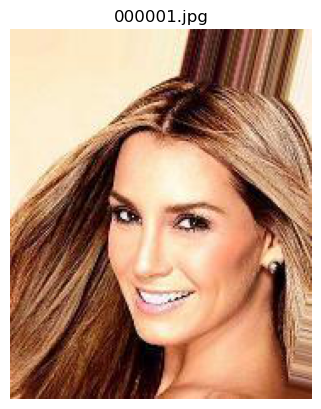

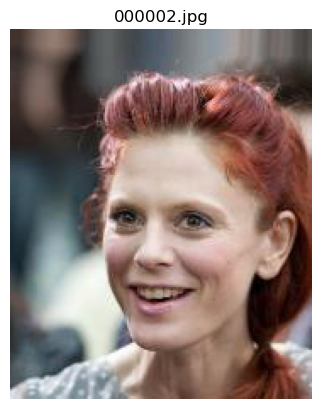

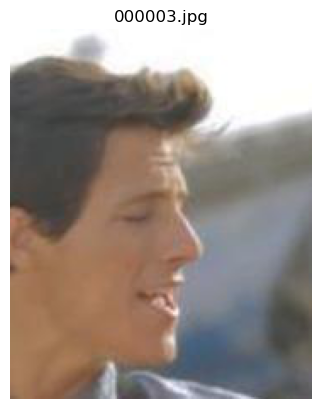

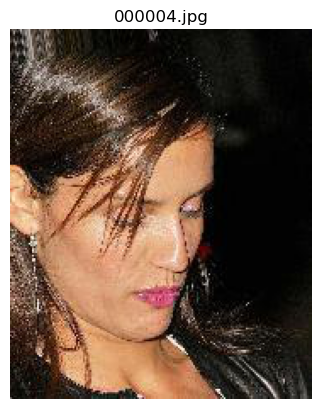

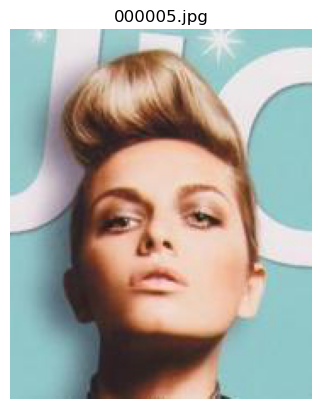

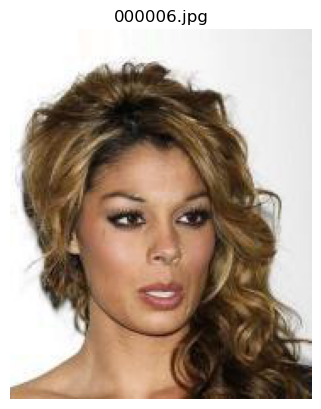

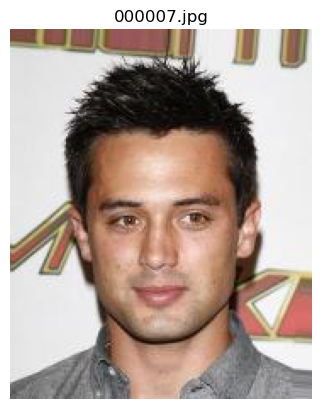

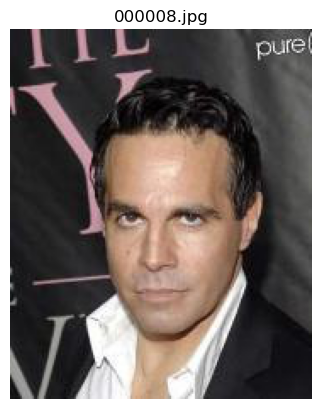

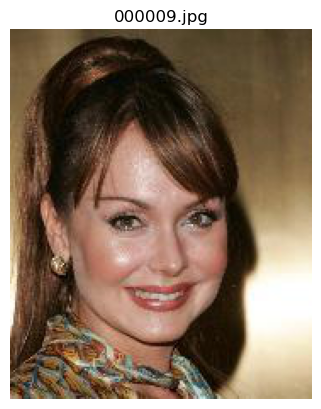

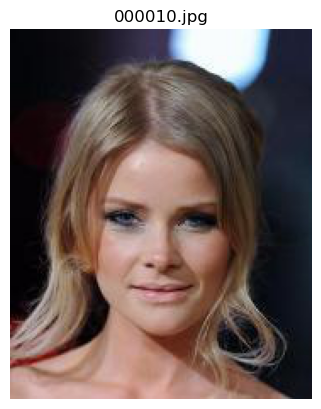

In [7]:

temp = celeba_df[0:10]
for i in range(10):
    row = temp.iloc[i]
    img = Image.open(row["image_path"])
    plt.imshow(img)
    plt.title(f"{row['image_id']}")
    plt.axis("off")
    plt.show()

# Ask about trustworthiness and compare

Scan for first number in the output and compare the std across each layer (0 means they all had the same results and larger means they differ more)

## Groundtruth 
- Asked the model "<image>\nOn a scale of 1-10 the trustworthiness of this person is a"

In [8]:


gt_results = pd.read_csv("/users/aparasel/scratch/interpretability/patchscopes/code/truth-trustworthy-CELEB_A_llava-7b-v1.1.csv")
gt_results

num_layers = 1
temp_res = gt_results.iloc[:, -1*num_layers:]
for i in range(num_layers):
    temp_res[f"layer_{i}_output"] = temp_res[f"inspect_layer{i}"].apply(
        lambda row: next(
            (
                int(match.group())  # e.g. 10, 100, etc.
                for val in (row if isinstance(row, (list, tuple)) else [row])
                if (match := re.search(r"\d+", str(val)))
            ),
            np.nan  # ensures the column can become numeric
        )
    ).astype("Int64") 

[temp_res[col].std() for col in temp_res.iloc[:, -1*num_layers:].columns]

[2.0520355381547004]

In [9]:
temp_res['layer_0_output'].describe()

count      1000.0
mean        8.269
std      2.052036
min           1.0
25%           7.0
50%           9.0
75%           9.0
max          10.0
Name: layer_0_output, dtype: Float64

In [10]:
temp_res['layer_0_output'].value_counts()

layer_0_output
9     588
7     204
10    149
1      59
Name: count, dtype: Int64

In [11]:
gt_groups = {
    val: temp_res.index[temp_res['layer_0_output'] == val].tolist()
    for val in temp_res['layer_0_output'].unique()
}
#gt_groups[1]

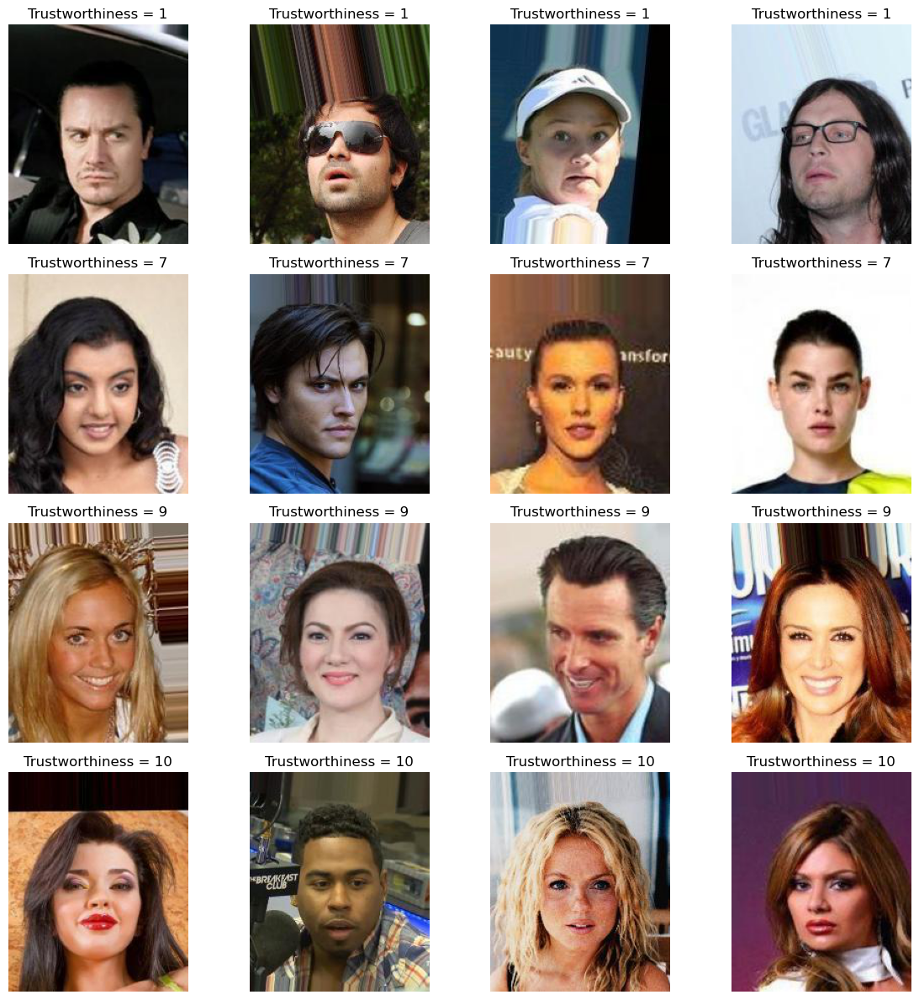

In [12]:
random_indices = temp_res.groupby('layer_0_output').sample(n=4).index

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(12, 12))
axes = axes.flatten() 
for i, index in enumerate(random_indices):
    row = celeba_df.iloc[index]
    img = Image.open(row["image_path"])
    axes[i].imshow(img)
    axes[i].set_title(f"Trustworthiness = {temp_res.iloc[index]['layer_0_output']}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()


# Patchscope
- Source prompt: "<image>\nThis person"
- Target prompt: "On a scale of 1-10 the trustworthiness of this person is a x"

stored here: "/users/aparasel/scratch/interpretability/patchscopes/code/CELEB_A-feature-processing_llava-test-7b-v1.1.csv"


NEXT TEST 
- Source prompt: "<image>\nOn a scale of 1-10 the trustworthiness of this person is a"
- Target prompt: "On a scale of 1-10 the trustworthiness of this person is a"

stored here: "/users/aparasel/scratch/interpretability/patchscopes/code/large-ident-CELEB_A-trustworthy_llava-7b-v1.1.csv"


In [13]:
num_layers = 32 #32 layers total 
results = pd.read_csv("/users/aparasel/scratch/interpretability/patchscopes/code/large-ident-CELEB_A-trustworthy_llava-7b-v1.1.csv")
results.iloc[0:10, -1*num_layers:]

,inspect_layer0,inspect_layer1,inspect_layer2,inspect_layer3,inspect_layer4,inspect_layer5,inspect_layer6,inspect_layer7,inspect_layer8,inspect_layer9,...,inspect_layer22,inspect_layer23,inspect_layer24,inspect_layer25,inspect_layer26,inspect_layer27,inspect_layer28,inspect_layer29,inspect_layer30,inspect_layer31
0,10. nobody can be that perfect. I would rate t...,9. nobody is perfect but this person is very c...,10. nobody trusts them. I have seen them lie a...,10. nobody trusts them. I have seen them lie a...,10. nobody is perfect but she is very honest a...,10. nobody can be that perfect. I would rate t...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,10. nobody is perfect but she is very close to...,10. nobody is perfect but she is very close to...
1,10. nobody can be that perfect. I would rate t...,9. nobody is perfect but she is very close to ...,10. nobody trusts them. I have seen them lie a...,10. nobody trusts them. I have seen them lie a...,10. nobody is perfect but she is very honest a...,10. nobody can be that perfect. I would rate t...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,10. nobody is perfect but she is very close to...,10. nobody is perfect but she is very close to...
2,10. nobody can be that perfect. I would rate t...,9. nobody is perfect but she is very close to ...,10. nobody trusts them. I have seen them lie a...,10. nobody trusts them. I have seen them lie a...,10. nobody is perfect but she is very honest a...,10. nobody can be that perfect. I would rate t...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,10. nobody is perfect but she is very close to...,10. nobody is perfect but she is very close to...
3,10. nobody can be that perfect. I would rate t...,9. nobody is perfect but she is very close to ...,10. nobody trusts them. I have seen them lie a...,10. nobody trusts them. I have seen them lie a...,10. nobody is perfect but she is very honest a...,10. nobody can be that perfect. I would rate t...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,9. nobody is perfect but she is very close to ...,...,10. nobody is perfect but she is very close to...,10. nobody is perfect but she is very close to...,10. nobody is perfect but she is very close to...,10. nobody 

In [14]:

temp_res = results.iloc[:, -1*num_layers:]
for i in range(num_layers):
    temp_res[f"layer_{i}_output"] = temp_res[f"inspect_layer{i}"].apply(
        lambda row: next(
            (
                int(match.group())  # e.g. 10, 100, etc.
                for val in (row if isinstance(row, (list, tuple)) else [row])
                if (match := re.search(r"\d+", str(val)))
            ),
            np.nan  # ensures the column can become numeric
        )
    ).astype("Int64") 

[temp_res[col].std() for col in temp_res.iloc[:, -1*num_layers:].columns]

[0.0,
 0.1467567291047928,
 0.06315051850925682,
 0.07056897321046963,
 0.1838717183495298,
 0.36112935966826953,
 0.21805400144814482,
 0.0,
 0.0,
 0.0,
 0.06315051850925682,
 0.04469897088298564,
 0.04469897088298564,
 0.3386601403925338,
 0.48304589153964794,
 0.49412565219806204,
 0.49459035536453755,
 0.4984821807090847,
 0.4725752081175305,
 0.44922355437109684,
 0.4279043141896353,
 0.43089403531456516,
 0.38930136855083824,
 0.4067978422810088,
 0.42607222103481185,
 0.37226681638655706,
 0.31304631925323445,
 0.31552425509864623,
 0.30799165387857325,
 0.2760202658994212,
 0.0,
 0.0]

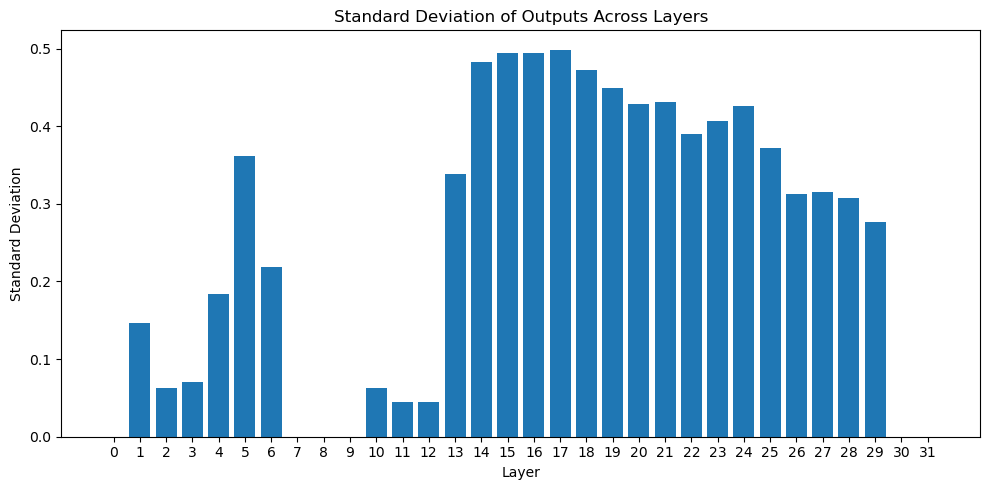

In [15]:
layers = list(range(0, num_layers))

stds = [temp_res[col].std() for col in temp_res.iloc[:, -1*num_layers:].columns]
plt.figure(figsize=(10, 5))
plt.bar(layers, stds)
plt.xlabel("Layer")
plt.ylabel("Standard Deviation")
plt.title("Standard Deviation of Outputs Across Layers")
plt.xticks(layers)  # ensure 1-20 ticks appear
plt.tight_layout()
plt.show()

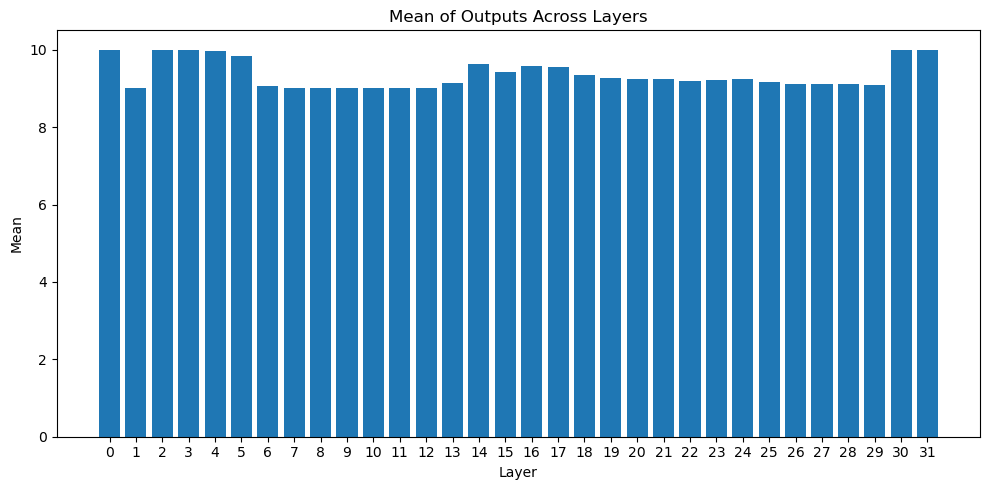

In [16]:
layers = list(range(0, num_layers))

means = [temp_res[col].mean() for col in temp_res.iloc[:, -1*num_layers:].columns]
plt.figure(figsize=(10, 5))
plt.bar(layers, means)
plt.xlabel("Layer")
plt.ylabel("Mean")
plt.title("Mean of Outputs Across Layers")
plt.xticks(layers)  # ensure 1-20 ticks appear
plt.tight_layout()
plt.show()

In [17]:
temp_res['layer_16_output'].value_counts()

layer_16_output
10    575
9     425
Name: count, dtype: Int64

In [18]:
temp_res['layer_16_output'].describe()

count     1000.0
mean       9.575
std      0.49459
min          9.0
25%          9.0
50%         10.0
75%         10.0
max         10.0
Name: layer_16_output, dtype: Float64

In [19]:
temp_res.groupby('layer_16_output').sample(n=4).iloc[:,-7:-2]

,layer_25_output,layer_26_output,layer_27_output,layer_28_output,layer_29_output
418,9,9,9,9,9
14,9,9,9,9,9
991,9,9,9,9,9
156,9,9,9,9,9
431,10,9,9,9,9
579,10,10,10,9,9
111,9,9,9,9,9
259,9,9,9,9,9


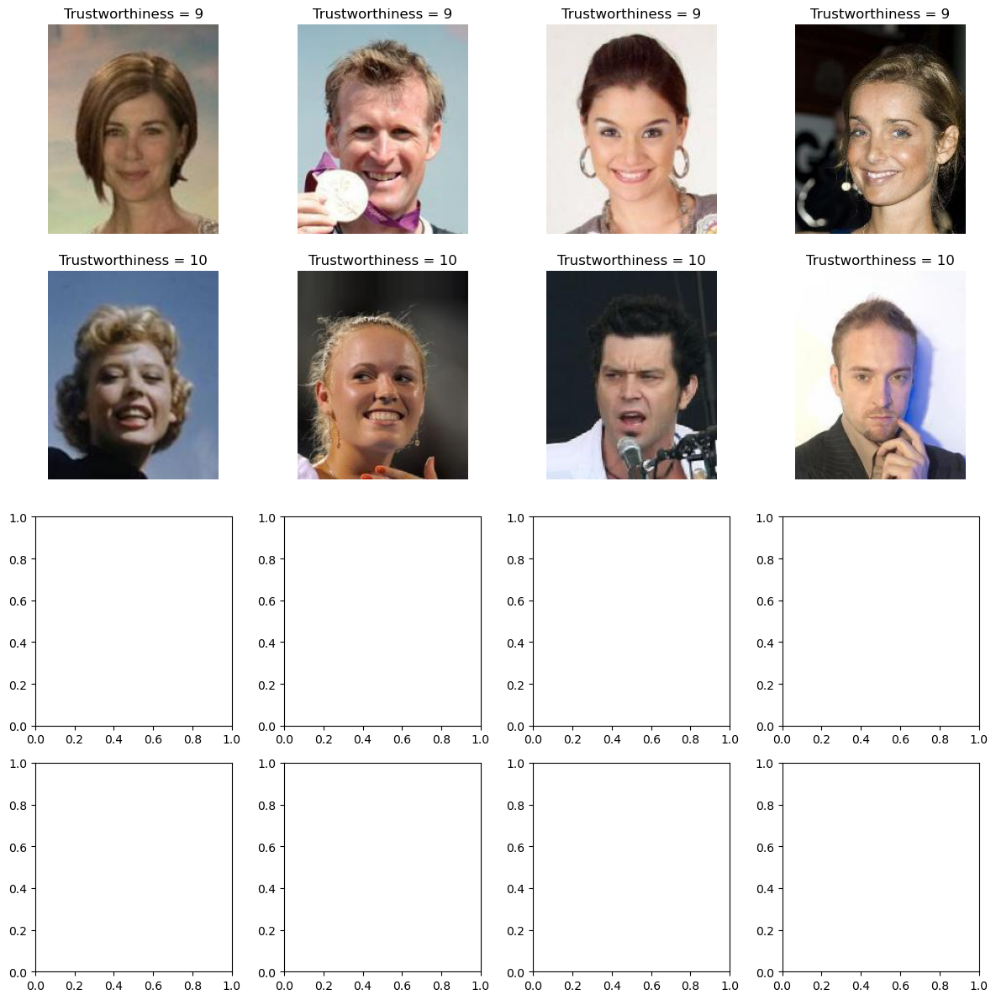

In [20]:
random_indices = temp_res.groupby('layer_16_output').sample(n=4).index

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(12, 12))
axes = axes.flatten() 
for i, index in enumerate(random_indices):
    row = celeba_df.iloc[index]
    img = Image.open(row["image_path"])
    axes[i].imshow(img)
    axes[i].set_title(f"Trustworthiness = {temp_res.iloc[index]['layer_16_output']}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()


## Compare Ground truth to outputs

In [21]:
#GT labels
#gt_labels = [indiciest_for_label1, indicies_for_label2,...]
relevant_df = temp_res.iloc[:, -1*num_layers:]
#gt_ys - each gt truth label val
label_means = []
label_stds = []
for key_num in gt_groups.keys():
    indicies = gt_groups[key_num]
    label_means.append([relevant_df.iloc[indicies][col].mean() for col in relevant_df.columns])
    label_stds.append([relevant_df.iloc[indicies][col].std() for col in relevant_df.columns])
    
    

In [22]:
relevant_df.columns

Index(['layer_0_output', 'layer_1_output', 'layer_2_output', 'layer_3_output',
       'layer_4_output', 'layer_5_output', 'layer_6_output', 'layer_7_output',
       'layer_8_output', 'layer_9_output', 'layer_10_output',
       'layer_11_output', 'layer_12_output', 'layer_13_output',
       'layer_14_output', 'layer_15_output', 'layer_16_output',
       'layer_17_output', 'layer_18_output', 'layer_19_output',
       'layer_20_output', 'layer_21_output', 'layer_22_output',
       'layer_23_output', 'layer_24_output', 'layer_25_output',
       'layer_26_output', 'layer_27_output', 'layer_28_output',
       'layer_29_output', 'layer_30_output', 'layer_31_output'],
      dtype='object')

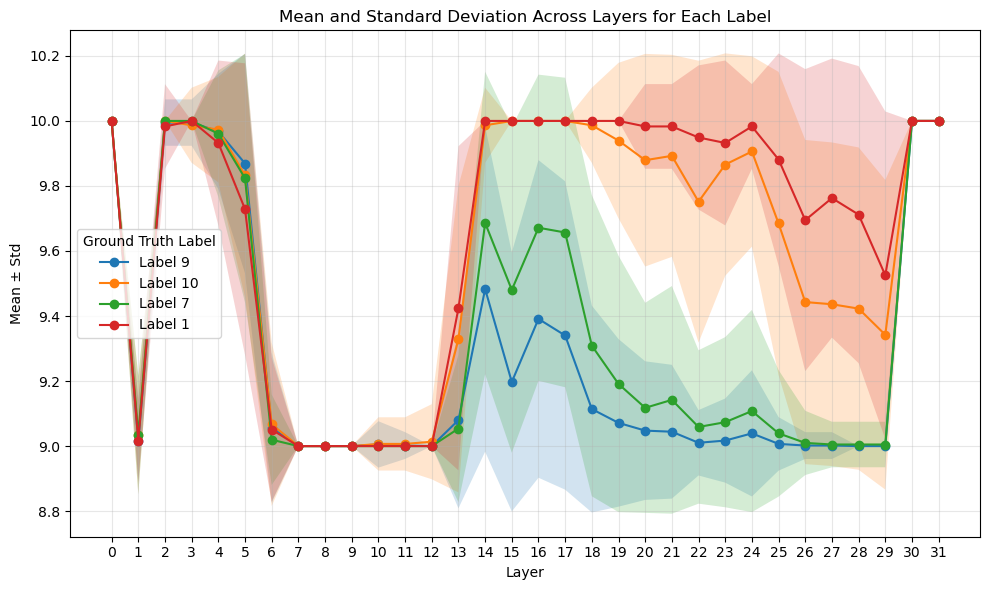

In [23]:
#Plot the mean over time for each true label
plt.figure(figsize=(10, 6))
layers=np.arange(num_layers)
for i, (means, stds) in enumerate(zip(label_means, label_stds)):
    means = np.array(means)
    stds = np.array(stds)
    plt.plot(layers, means, marker='o', label=f"Label {list(gt_groups.keys())[i]}")
    plt.fill_between(layers, means - stds, means + stds, alpha=0.2)

plt.xlabel("Layer")
plt.ylabel("Mean ± Std")
plt.xticks(layers.astype(int))
plt.title("Mean and Standard Deviation Across Layers for Each Label")
plt.legend(title="Ground Truth Label")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


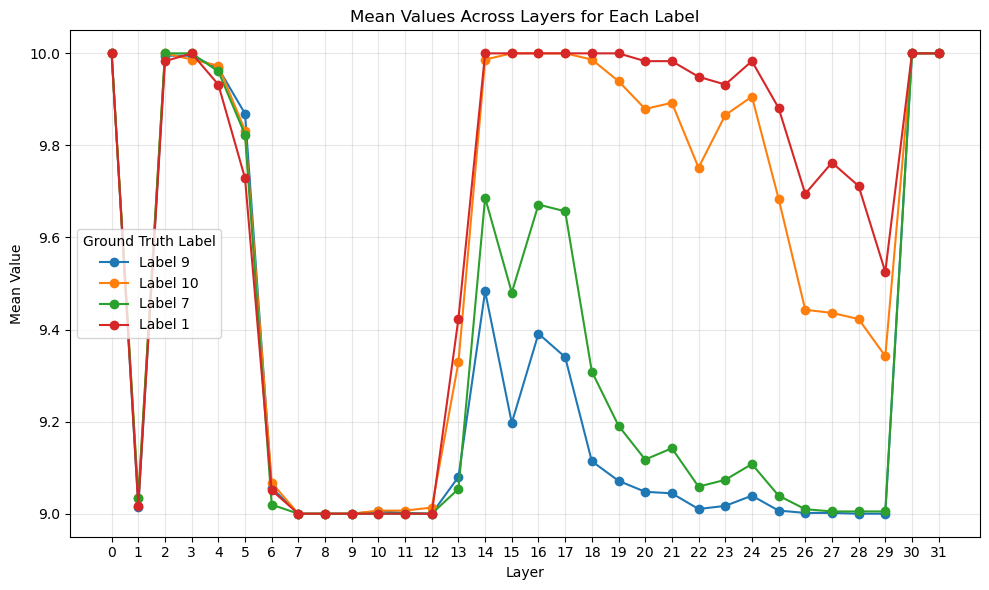

In [24]:
layers=np.arange(num_layers)

plt.figure(figsize=(10, 6))

for i, means in enumerate(label_means):
    plt.plot(layers, means, marker='o', label=f"Label {list(gt_groups.keys())[i]}")

plt.xlabel("Layer")
plt.ylabel("Mean Value")
plt.xticks(layers.astype(int))
plt.title("Mean Values Across Layers for Each Label")
plt.legend(title="Ground Truth Label")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


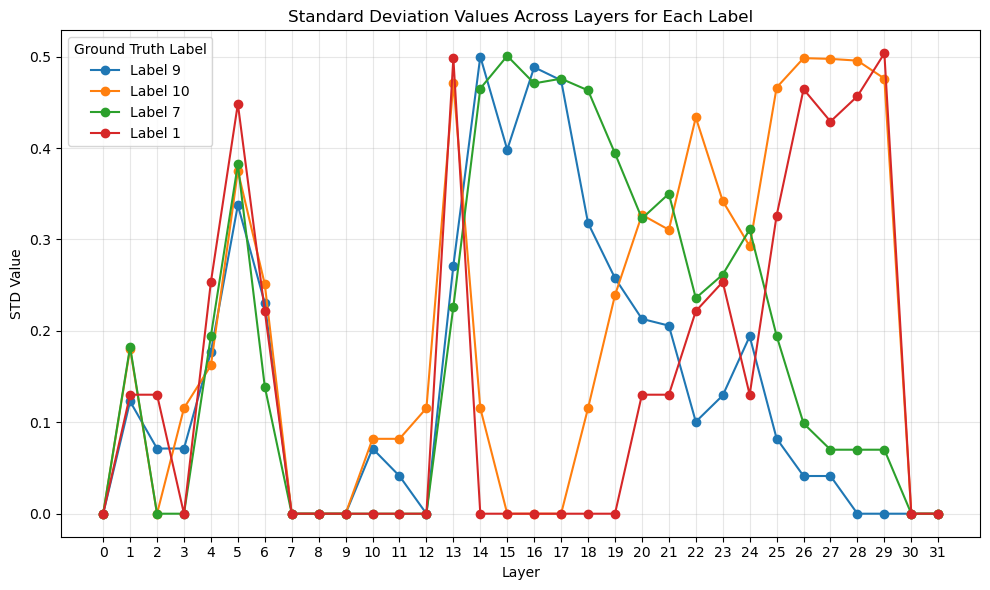

In [25]:
layers=np.arange(num_layers)

plt.figure(figsize=(10, 6))

for i, stds in enumerate(label_stds):
    plt.plot(layers, stds, marker='o', label=f"Label {list(gt_groups.keys())[i]}")

plt.xlabel("Layer")
plt.ylabel("STD Value")
plt.xticks(layers.astype(int))
plt.title("Standard Deviation Values Across Layers for Each Label")
plt.legend(title="Ground Truth Label")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


# Hair Color

In [26]:
num_layers = 20 #32 layers total 
results = pd.read_csv("/users/aparasel/scratch/interpretability/patchscopes/code/large-test-CELEB_A-haircolor-processing-concrete_llava-7b-v1.1.csv")
results.iloc[0:10, -1*num_layers:]
#results.iloc[:, -1*num_layers+10:(-1*num_layers)+31]

,inspect_layer0,inspect_layer1,inspect_layer2,inspect_layer3,inspect_layer4,inspect_layer5,inspect_layer6,inspect_layer7,inspect_layer8,inspect_layer9,inspect_layer10,inspect_layer11,inspect_layer12,inspect_layer13,inspect_layer14,inspect_layer15,inspect_layer16,inspect_layer17,inspect_layer18,inspect_layer19
0,is a blond. nobody else matches.</s>,with black hair. nobody else matches.</s>,has black hair. nobody else has black hair.</s>,"has black hair. nobody has blond, brown, or gr...",has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,"has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...",has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the right hair...,has brown hair. nobody else has the right hair...,has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the correct ha...,"is {Black, Blond, Brown, Gray}</s>","is {Black, Blond, Brown, Gray}</s>","is {Black, Blond, Brown, Gray}</s>"
1,is a blond. nobody else matches.</s>,with black hair. nobody else matches the descr...,has black hair. nobody else has black hair.</s>,"has black hair. nobody has blond, brown, or gr...",has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,"has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...",has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the right hair...,has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the correct ha...
2,with black hair. nobody else matches the descr...,with black hair. nobody else matches the descr...,has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,"has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...",has brown hair. nobody else has the right hair...,has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the right hair...,has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the correct ha...,"is {Black, Blond, Brown, Gray}</s>","is {Black, Blond, Brown, Gray}</s>","is {Black, Blond, Brown, Gray}</s>"
3,is a blond. nobody else matches.</s>,with black hair. nobody else matches the descr...,has black hair. nobody else has black hair.</s>,"has black hair. nobody has blond, brown, or gr...",has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,"has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...",has brown hair. nobody else has the right hair...,has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the correct ha...,has brown hair. nobody else has the correct ha...,ha

In [27]:
!pip install sentence-transformers

In [28]:
from sentence_transformers import SentenceTransformer
import numpy as np

model_name = "sentence-transformers/all-MiniLM-L6-v2"  # fast+solid baseline
model = SentenceTransformer(model_name, device="cpu")

texts = [
    "Has black hair",
    "is a blond. nobody else matches.</s>",
    "has black hair. nobody else has black hair.</s>",
    "has dark brown hair. nobody else has black hair.</s>",
    "Puppies sprint across the field."
]

emb = model.encode(texts, batch_size=64, convert_to_numpy=True, normalize_embeddings=True)
print(emb.shape)  


/users/aparasel/.conda/envs/patchscopes-llava/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/users/aparasel/.conda/envs/patchscopes-llava/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


(5, 384)


In [29]:

# The path to your text file
file_path = "/users/aparasel/scratch/temp_data/list_attr_celeba.txt"

# Read the file directly with read_csv, using the regex separator
annot_face = pd.read_csv(
    file_path,
    sep=r'\s+',  # Regex to handle one or more spaces as a separator
    header=0     # Use the first line as the header
)
print(annot_face.columns)
# Rename the first column for clarity and set it as the index
annot_face = annot_face.rename(columns={'Unnamed: 0': 'image_id'})

# Display the first few rows of the DataFrame
annot_face.iloc[:1000]['Black_Hair'].sum() + annot_face.iloc[:1000]['Blond_Hair'].sum() + annot_face.iloc[:1000]['Gray_Hair'].sum() + annot_face.iloc[:1000]['Brown_Hair'].sum()

Index(['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes',
       'Bald', 'Bangs', 'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair',
       'Blurry', 'Brown_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin',
       'Eyeglasses', 'Goatee', 'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones',
       'Male', 'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'No_Beard',
       'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline',
       'Rosy_Cheeks', 'Sideburns', 'Smiling', 'Straight_Hair', 'Wavy_Hair',
       'Wearing_Earrings', 'Wearing_Hat', 'Wearing_Lipstick',
       'Wearing_Necklace', 'Wearing_Necktie', 'Young'],
      dtype='object')


-2690

In [30]:
annot_face_split = annot_face.iloc[:1000]
annot_face_split['Black_Hair'] = annot_face_split['Black_Hair'].apply(lambda x: 1 if x==1 else 0)
annot_face_split['Blond_Hair'] = annot_face_split['Blond_Hair'].apply(lambda x: 1 if x==1 else 0)
annot_face_split['Gray_Hair'] = annot_face_split['Gray_Hair'].apply(lambda x: 1 if x==1 else 0)
annot_face_split['Brown_Hair'] = annot_face_split['Brown_Hair'].apply(lambda x: 1 if x==1 else 0)
annot_face_split = annot_face_split.reset_index()
annot_face_split = annot_face_split[(annot_face_split["Black_Hair"] == 1) | (annot_face_split["Blond_Hair"] == 1) | (annot_face_split["Gray_Hair"] == 1) | (annot_face_split["Brown_Hair"] == 1)]

/tmp/ipykernel_3339486/1766876983.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  annot_face_split['Black_Hair'] = annot_face_split['Black_Hair'].apply(lambda x: 1 if x==1 else 0)
/tmp/ipykernel_3339486/1766876983.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  annot_face_split['Blond_Hair'] = annot_face_split['Blond_Hair'].apply(lambda x: 1 if x==1 else 0)
/tmp/ipykernel_3339486/1766876983.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

In [31]:
annot_face_split['Gray_Hair'].sum()

54

In [32]:
annot_face_split["True_Hair"] = np.arange(annot_face_split.shape[0])
for i in range(annot_face_split.shape[0]):
    if annot_face_split["Black_Hair"].iloc[i] == 1:
        annot_face_split["True_Hair"].iloc[i] = "black hair"
    elif annot_face_split["Blond_Hair"].iloc[i] == 1:
        annot_face_split["True_Hair"].iloc[i] = "blond hair"
    elif annot_face_split["Brown_Hair"].iloc[i] == 1:
        annot_face_split["True_Hair"].iloc[i] = "brown hair"
    elif annot_face_split["Gray_Hair"].iloc[i] == 1:
        annot_face_split["True_Hair"].iloc[i] = "gray hair"
    
annot_face_split

/tmp/ipykernel_3339486/1196194891.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  annot_face_split["True_Hair"].iloc[i] = "brown hair"


,index,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,...,Smiling,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young,True_Hair
0,000001.jpg,-1,1,1,-1,-1,-1,-1,-1,0,...,1,1,-1,1,-1,1,-1,-1,1,brown hair
1,000002.jpg,-1,-1,-1,1,-1,-1,-1,1,0,...,1,-1,-1,-1,-1,-1,-1,-1,1,brown hair
5,000006.jpg,-1,1,1,-1,-1,-1,1,-1,0,...,-1,-1,1,1,-1,1,-1,-1,1,brown hair
6,000007.jpg,1,-1,1,1,-1,-1,1,1,1,...,-1,1,-1,-1,-1,-1,-1,-1,1,black hair
7,000008.jpg,1,1,-1,1,-1,-1,1,-1,1,...,-1,-1,-1,-1,-1,-1,-1,-1,1,black hair
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
992,000993.jpg,-1,-1,-1,1,-1,-1,-1,1,0,...,1,-1,-1,-1,-1,-1,-1,-1,-1,gray hair
993,000994.jpg,-1,-1,-1,-1,-1,-1,-1,-1,0,...,-1,-1,1,-1,-1,-1,-1,-1,1,brown hair
995,000996.jpg,-1,1,-1,-1,-1,1,-1,-1,0,...,1,-1,-1,1,-1,1,1,-1,-1,blond hair
996,000997.jpg,-1,-1,1,-1,-1,1,-1,-1,0,...,-1,-1,-1,1,-1,1,-1,-1,-1,blond hair


In [33]:
def mean_sq_dist_to_centroid(sentence_embs): #Compute average distance from centorid 
    sentence_embs = np.asarray(sentence_embs, dtype=float)

    centroid = sentence_embs.mean(axis=0, keepdims=True)      
    sq_dists = np.sum((sentence_embs - centroid) ** 2, axis=1)
    return float(np.mean(sq_dists))

hair_results = results.iloc[:, -1*num_layers:]
hair_results = hair_results.iloc[annot_face_split.index]

correct_sentences = annot_face_split["True_Hair"].to_list()
correct_embds = model.encode(correct_sentences, batch_size=64, convert_to_numpy=True, normalize_embeddings=True)
print(correct_embds.shape)

embd_variation = []
for i in range(hair_results.shape[1]):
    layer_outputs = hair_results[f"inspect_layer{i}"].to_list()
    layer_embds = model.encode(layer_outputs, batch_size=64, convert_to_numpy=True, normalize_embeddings=True)
    embd_variation.append(mean_sq_dist_to_centroid(layer_embds))
    pairs = layer_embds @ correct_embds.T   
    scores = np.diag(pairs) 
    hair_results[f"layer_{i}_score"] = scores
hair_results

(638, 384)


,inspect_layer0,inspect_layer1,inspect_layer2,inspect_layer3,inspect_layer4,inspect_layer5,inspect_layer6,inspect_layer7,inspect_layer8,inspect_layer9,...,layer_10_score,layer_11_score,layer_12_score,layer_13_score,layer_14_score,layer_15_score,layer_16_score,layer_17_score,layer_18_score,layer_19_score
0,is a blond. nobody else matches.</s>,with black hair. nobody else matches.</s>,has black hair. nobody else has black hair.</s>,"has black hair. nobody has blond, brown, or gr...",has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,"has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...",has brown hair. nobody else has the correct ha...,...,0.768339,0.768339,0.791808,0.791808,0.791808,0.791808,0.791808,0.467278,0.467278,0.467278
1,is a blond. nobody else matches.</s>,with black hair. nobody else matches the descr...,has black hair. nobody else has black hair.</s>,"has black hair. nobody has blond, brown, or gr...",has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,"has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...",has brown hair. nobody else has the correct ha...,...,0.768339,0.791808,0.791808,0.791808,0.791808,0.791808,0.791808,0.791808,0.791808,0.791808
5,is a blond. nobody else has hair color that ma...,is Brown. nobody else matches.</s>,has black hair. nobody else has black hair.</s>,"has black hair. nobody has blond, brown, or gr...",has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,"has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...",has brown hair. nobody else has the correct ha...,...,0.768339,0.791808,0.791808,0.791808,0.791808,0.791808,0.791808,0.395264,0.467278,0.467278
6,is Black. nobody else matches.</s>,with black hair. nobody else matches.</s>,has black hair. nobody else has black hair.</s>,"has black hair. nobody has blond, brown, or gr...",has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,"has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...",has brown hair. nobody else has the correct ha...,...,0.523035,0.540246,0.540246,0.540246,0.540246,0.540246,0.540246,0.539724,0.418329,0.418329
7,person person person person person person pers...,"is {Black, Blond, Brown, Gray}.</s>",has black hair. nobody else has black hair.</s>,"has black hair. nobody has blond, brown, or gr...",has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,"has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...",has brown hair. nobody else has the correct ha...,...,0.523035,0.523035,0.540246,0.540246,0.540246,0.540246,0.369330,0.539724,0.418329,0.418329
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
992,is a blond. nobody has black hair.</s>,"is {Black, Blond, Brown, Gray}</s>",has black hair. nobody else has black hair.</s>,"has black hair. nobody has blond, brown, or gr...",has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,"has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...",...,0.552699,0.573899,0.573899,0.573899,0.573899,0.573899,0.368656,0.354105,0.442798,0.442798
993,is Black. nobody else matches.</s>,with black hair. nobody else matches the descr...,has black hair. nobody else has bl

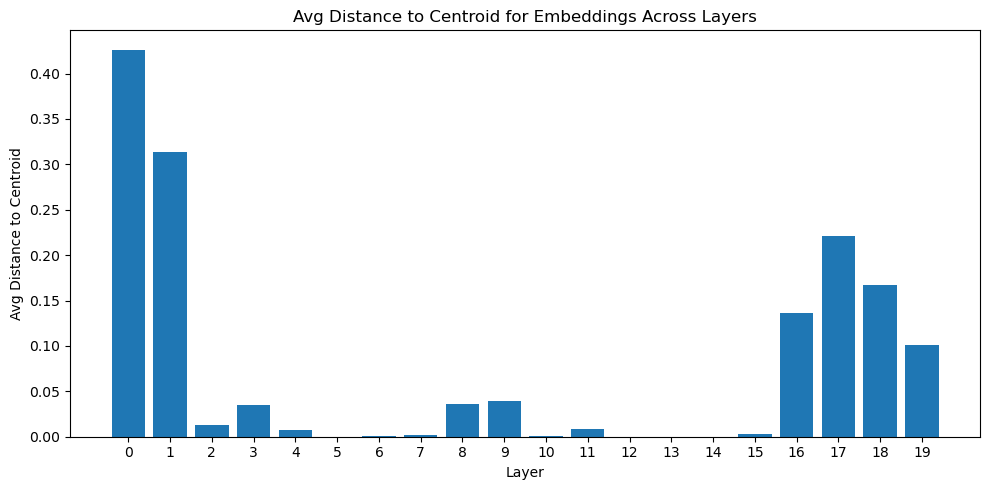

In [34]:
#Embedding variation per layer 
layers = list(range(0, num_layers))

plt.figure(figsize=(10, 5))
plt.bar(layers, embd_variation)
plt.xlabel("Layer")
plt.ylabel("Avg Distance to Centroid")
plt.title("Avg Distance to Centroid for Embeddings Across Layers")
plt.xticks(layers)  # ensure 1-20 ticks appear
plt.tight_layout()
plt.show()

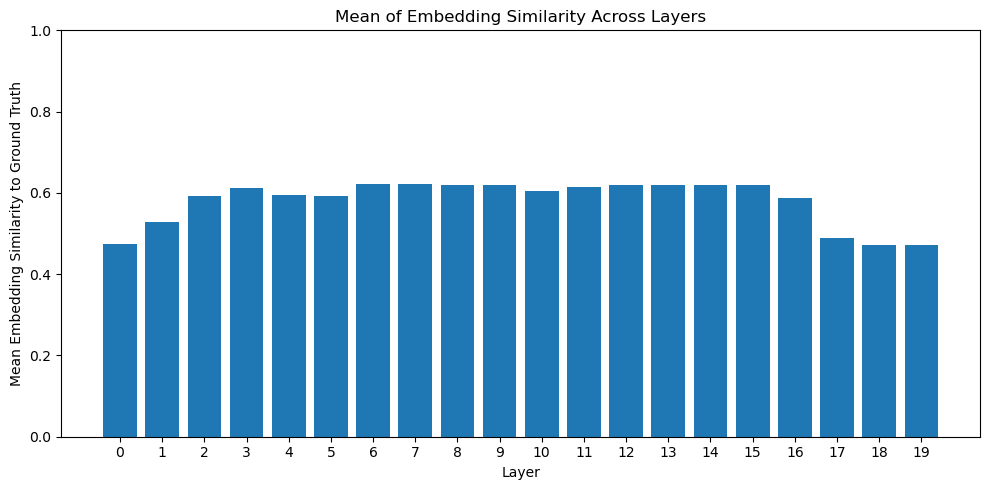

In [35]:
means = hair_results.iloc[:,-20:].mean().to_list()
layers = list(range(0, num_layers))

plt.figure(figsize=(10, 5))
plt.bar(layers, means)
plt.xlabel("Layer")
plt.ylabel("Mean Embedding Similarity to Ground Truth")
plt.title("Mean of Embedding Similarity Across Layers")
plt.xticks(layers)  
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

In [36]:
hair_results

,inspect_layer0,inspect_layer1,inspect_layer2,inspect_layer3,inspect_layer4,inspect_layer5,inspect_layer6,inspect_layer7,inspect_layer8,inspect_layer9,...,layer_10_score,layer_11_score,layer_12_score,layer_13_score,layer_14_score,layer_15_score,layer_16_score,layer_17_score,layer_18_score,layer_19_score
0,is a blond. nobody else matches.</s>,with black hair. nobody else matches.</s>,has black hair. nobody else has black hair.</s>,"has black hair. nobody has blond, brown, or gr...",has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,"has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...",has brown hair. nobody else has the correct ha...,...,0.768339,0.768339,0.791808,0.791808,0.791808,0.791808,0.791808,0.467278,0.467278,0.467278
1,is a blond. nobody else matches.</s>,with black hair. nobody else matches the descr...,has black hair. nobody else has black hair.</s>,"has black hair. nobody has blond, brown, or gr...",has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,"has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...",has brown hair. nobody else has the correct ha...,...,0.768339,0.791808,0.791808,0.791808,0.791808,0.791808,0.791808,0.791808,0.791808,0.791808
5,is a blond. nobody else has hair color that ma...,is Brown. nobody else matches.</s>,has black hair. nobody else has black hair.</s>,"has black hair. nobody has blond, brown, or gr...",has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,"has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...",has brown hair. nobody else has the correct ha...,...,0.768339,0.791808,0.791808,0.791808,0.791808,0.791808,0.791808,0.395264,0.467278,0.467278
6,is Black. nobody else matches.</s>,with black hair. nobody else matches.</s>,has black hair. nobody else has black hair.</s>,"has black hair. nobody has blond, brown, or gr...",has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,"has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...",has brown hair. nobody else has the correct ha...,...,0.523035,0.540246,0.540246,0.540246,0.540246,0.540246,0.540246,0.539724,0.418329,0.418329
7,person person person person person person pers...,"is {Black, Blond, Brown, Gray}.</s>",has black hair. nobody else has black hair.</s>,"has black hair. nobody has blond, brown, or gr...",has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,"has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...",has brown hair. nobody else has the correct ha...,...,0.523035,0.523035,0.540246,0.540246,0.540246,0.540246,0.369330,0.539724,0.418329,0.418329
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
992,is a blond. nobody has black hair.</s>,"is {Black, Blond, Brown, Gray}</s>",has black hair. nobody else has black hair.</s>,"has black hair. nobody has blond, brown, or gr...",has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,"has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...",...,0.552699,0.573899,0.573899,0.573899,0.573899,0.573899,0.368656,0.354105,0.442798,0.442798
993,is Black. nobody else matches.</s>,with black hair. nobody else matches the descr...,has black hair. nobody else has bl

## Blond hair check

In [37]:
blond_hair_split = annot_face.iloc[:1000].reset_index()
blond_hair_split['Blond_Hair'] = blond_hair_split['Blond_Hair'].apply(lambda x: 1 if x==1 else 0)
blond_hair_split = blond_hair_split[(blond_hair_split["Blond_Hair"] == 1)]


blond_hair_split["True_Hair"] = np.arange(blond_hair_split.shape[0])
for i in range(blond_hair_split.shape[0]):
    if blond_hair_split["Blond_Hair"].iloc[i] == 1:
        blond_hair_split["True_Hair"].iloc[i] = "blond hair"
    
#blond_hair_split.index = np.arange(blond_hair_split.shape[0])
blond_hair_split

/tmp/ipykernel_3339486/4192124573.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  blond_hair_split["True_Hair"].iloc[i] = "blond hair"


,index,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,...,Smiling,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young,True_Hair
12,000013.jpg,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,1,1,-1,-1,-1,-1,-1,-1,1,blond hair
17,000018.jpg,-1,1,-1,-1,-1,-1,-1,1,-1,...,1,-1,1,1,-1,1,1,-1,-1,blond hair
18,000019.jpg,-1,1,1,-1,-1,-1,-1,-1,-1,...,-1,-1,1,-1,-1,1,1,-1,1,blond hair
21,000022.jpg,-1,1,-1,-1,-1,-1,1,-1,-1,...,-1,-1,1,-1,-1,1,1,-1,1,blond hair
23,000024.jpg,-1,1,1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,1,-1,1,1,-1,1,blond hair
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
984,000985.jpg,-1,-1,-1,-1,-1,-1,1,-1,-1,...,-1,-1,1,-1,-1,-1,-1,-1,1,blond hair
985,000986.jpg,-1,1,1,-1,-1,-1,1,-1,-1,...,1,-1,1,1,-1,1,-1,-1,1,blond hair
995,000996.jpg,-1,1,-1,-1,-1,1,-1,-1,-1,...,1,-1,-1,1,-1,1,1,-1,-1,blond hair
996,000997.jpg,-1,-1,1,-1,-1,1,-1,-1,-1,...,-1,-1,-1,1,-1,1,-1,-1,-1,blond hair


In [38]:
blond_hair_results = results.iloc[:, -1*num_layers:]
blond_hair_results = blond_hair_results.iloc[blond_hair_split.index]

correct_sentences = blond_hair_split["True_Hair"].to_list()
correct_embds = model.encode(correct_sentences, batch_size=64, convert_to_numpy=True, normalize_embeddings=True)
print(correct_embds.shape)

embd_variation = []
for i in range(blond_hair_results.shape[1]):
    layer_outputs = blond_hair_results[f"inspect_layer{i}"].to_list()
    layer_embds = model.encode(layer_outputs, batch_size=64, convert_to_numpy=True, normalize_embeddings=True)
    embd_variation.append(mean_sq_dist_to_centroid(layer_embds))
    pairs = layer_embds @ correct_embds.T   
    scores = np.diag(pairs) 
    blond_hair_results[f"layer_{i}_score"] = scores
blond_hair_results

(148, 384)


,inspect_layer0,inspect_layer1,inspect_layer2,inspect_layer3,inspect_layer4,inspect_layer5,inspect_layer6,inspect_layer7,inspect_layer8,inspect_layer9,...,layer_10_score,layer_11_score,layer_12_score,layer_13_score,layer_14_score,layer_15_score,layer_16_score,layer_17_score,layer_18_score,layer_19_score
12,is Black. nobody else matches.</s>,is Brown. nobody else matches.</s>,has black hair. nobody else has black hair.</s>,"has black hair. nobody has blond, brown, or gr...",has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,"has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...",has brown hair. nobody has black hair. The per...,...,0.546069,0.550733,0.550733,0.550733,0.550733,0.550733,0.550733,0.287372,0.469409,0.469409
17,is a blond. nobody has black hair.</s>,"is {Black, Blond, Brown, Gray}.</s>",has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,"has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...",...,0.546069,0.550733,0.550733,0.550733,0.550733,0.550733,0.550733,0.705376,0.287372,0.469409
18,person person person person person person pers...,"is {Black, Blond, Brown, Gray}</s>",is a blond. nobody else has blond hair.</s>,"has black hair. nobody has blond, brown, or gr...",has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,"has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...",has brown hair. nobody else has the correct ha...,...,0.546069,0.550733,0.550733,0.550733,0.550733,0.550733,0.550733,0.705376,0.287372,0.469409
21,is a blond. nobody has black hair.</s>,is Brown. nobody else matches.</s>,has black hair. nobody else has black hair.</s>,"has black hair. nobody has blond, brown, or gr...",has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,"has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...",has brown hair. nobody else has the correct ha...,...,0.546069,0.546069,0.550733,0.550733,0.550733,0.550733,0.550733,0.287372,0.469409,0.469409
23,is a blond. nobody else matches.</s>,is Brown. nobody else matches.</s>,has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,"has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...",has brown hair. nobody else has the correct ha...,...,0.546069,0.546069,0.550733,0.550733,0.550733,0.550733,0.550733,0.287372,0.287372,0.469409
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
984,is Black. nobody else matches.</s>,with black hair. nobody else matches the descr...,has black hair. nobody else has black hair.</s>,"has black hair. nobody has blond, brown, or gr...",has black hair. nobody else has black hair.</s>,has black hair. nobody else has black hair.</s>,"has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...","has brown hair. nobody has black, blond, or gr...",has brown hair. nobody else has the correct ha...,...,0.546069,0.546069,0.550733,0.550733,0.550733,0.550733,0.550733,0.287372,0.287372,0.469409
985,"is {Black, Blond, Brown, Gray}</s>","is {Black, Blond, Brown, Gray}.</s>",has black hair. nobody else has black hair.</s>,"has black hair. nobody has bl

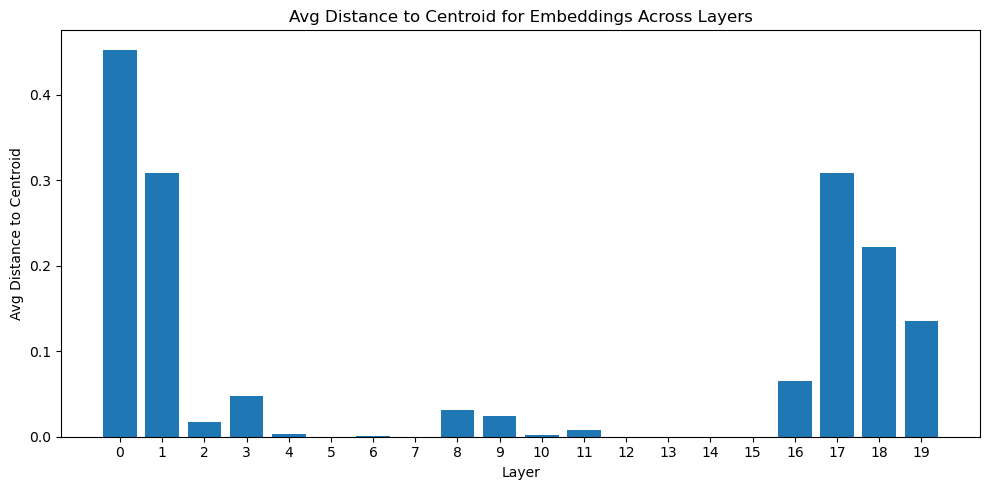

In [39]:
#Embedding variation per layer 
layers = list(range(0, num_layers))

plt.figure(figsize=(10, 5))
plt.bar(layers, embd_variation)
plt.xlabel("Layer")
plt.ylabel("Avg Distance to Centroid")
plt.title("Avg Distance to Centroid for Embeddings Across Layers")
plt.xticks(layers)  # ensure 1-20 ticks appear
plt.tight_layout()
plt.show()

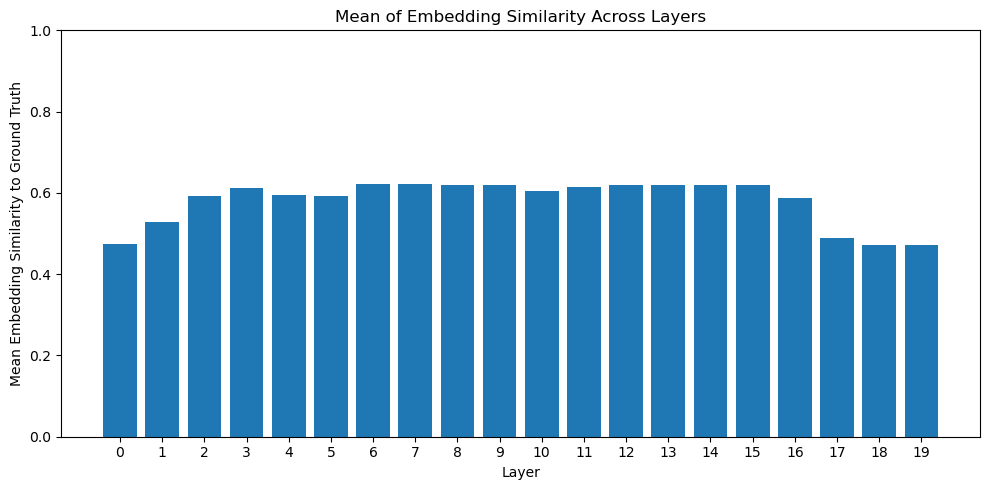

In [40]:
means = hair_results.iloc[:,-20:].mean().to_list()
layers = list(range(0, num_layers))

plt.figure(figsize=(10, 5))
plt.bar(layers, means)
plt.xlabel("Layer")
plt.ylabel("Mean Embedding Similarity to Ground Truth")
plt.title("Mean of Embedding Similarity Across Layers")
plt.xticks(layers)  
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

# Attractiveness analysis

In [41]:
num_layers = 20 #32 layers total 
results = pd.read_csv("/users/aparasel/scratch/interpretability/patchscopes/code/large-test-CELEB_A-attrative-processing_llava-mess-7b-v1.1.csv")
results.iloc[:, -1*num_layers:]

,inspect_layer0,inspect_layer1,inspect_layer2,inspect_layer3,inspect_layer4,inspect_layer5,inspect_layer6,inspect_layer7,inspect_layer8,inspect_layer9,inspect_layer10,inspect_layer11,inspect_layer12,inspect_layer13,inspect_layer14,inspect_layer15,inspect_layer16,inspect_layer17,inspect_layer18,inspect_layer19
0,"who is a 5. nobody is perfect, but they are ve...",is a 7. nobody is a 10. Everyone has their own...,is a 10. nobody can match this person's beauty...,is a 7. nobody is perfect but they are very cl...,is a 7. nobody is perfect but they are very cl...,"is a 7. nobody is perfect, but they have a gre...","is a 7. nobody is perfect, but they are very c...",is a 7. nobody is perfect but they are very cl...,is a 7. nobody is perfect but they are very cl...,is a 7. nobody is perfect but they are very cl...,is a 7. nobody is perfect but they are very cl...,"is a 7. nobody is a 10, but this person is ver...","is a 7. nobody is a 10, but this person is ver...","is a 7. nobody is a 10, but this person is ver...","is a 7. nobody is a 10, but this person is ver...","is a 7. nobody is a 10, but this person is ver...","is a 7. nobody is a 10, but this person is ver...","is 5. nobody is a 10, but this person is not a...","is 5. nobody is a 10, but this person is not a...","is 5. nobody is a 10, but this person is not a..."
1,"who is a 7. nobody is perfect, but she is very...",ality a 9. nobody is perfect but she is very c...,is a 10. nobody can match this person's beauty...,is a 7. nobody is perfect but they are very cl...,is a 7. nobody is perfect but they are very cl...,is a 7. nobody is perfect but they are very cl...,is a 7. nobody is perfect but they are very cl...,is a 7. nobody is perfect but they are very cl...,is a 7. nobody is perfect but they are very cl...,is a 7. nobody is perfect but they are very cl...,is a 7. nobody is perfect but they are very cl...,"is a 7. nobody is a 10, but this person is ver...","is a 7. nobody is a 10, but this person is ver...","is a 7. nobody is a 10, but this person is ver...","is a 7. nobody is a 10, but this person is ver...","is a 7. nobody is a 10, but this person is ver...","is a 7. nobody is a 10, but this person is ver...","is 5. nobody is a 10, but this person is not a...","is 5. nobody is a 10, but this person is not a...","is 5. nobody is a 10, but this person is not a..."
2,"who is a 7. nobody is perfect, but she is very...",ality a 9. nobody is perfect but she is very c...,is a 10. nobody can match this person's beauty...,is a 7. nobody is perfect but they are very cl...,is a 7. nobody is perfect but they are very cl...,"is a 7. nobody is perfect, but they have a gre...",is a 7. nobody is perfect but they are very cl...,is a 7. nobody is perfect but they are very cl...,is a 7. nobody is perfect but they are very cl...,is a 7. nobody is perfect but they are very cl...,is a 7. nobody is perfect but they are very cl...,"is a 7. nobody is a 10, but this person is ver...","is a 7. nobody is a 10, but this person is ver...","is a 7. nobody is a 10, but this person is ver...","is a 7. nobody is a 10, but this person is ver...","is a 7. nobody is a 10, but this person is ver...","is a 7. nobody is a 10, but this person is ver...","is 5. nobody is a 10, but this person is not a...","is 5. nobody is a 10, but this person is not a...","is 5. nobody is a 10, but this person is not a..."
3,"who is a 5. nobody is perfect, but they are ve...",ality a 9. nobody is perfect but she is very c...,"a 7. nobody is a 10, but this person is very a...",is a 7. nobody is perfect but they are very cl...,is a 7. nobody is perfect but they are very cl...,is a 7. nobody is perfect but they are very cl...,is a 7. nobody is perfect but they are very cl...,is a 7. nobody is perfect but they are very cl...,is a 7. nobody is perfect but they are very cl...,is a 7. nobody is perfect but they are very cl...,is a 7. nobody is perfect but they are very cl...,"is a 7. nobody is a 10, but this person is ver...","is a 7. 

In [42]:
import re
import numpy as np
temp_res = results.iloc[:, -1*num_layers:]
for i in range(num_layers):
    temp_res[f"layer_{i}_output"] = temp_res[f"inspect_layer{i}"].apply(
        lambda row: next(
            (
                int(match.group())  # e.g. 10, 100, etc.
                for val in (row if isinstance(row, (list, tuple)) else [row])
                if (match := re.search(r"\d+", str(val)))
            ),
            np.nan  # ensures the column can become numeric
        )
    ).astype("Int64") 

[temp_res[col].std() for col in temp_res.iloc[:, -1*num_layers:].columns]

[0.9666283517310933,
 0.8131720051811425,
 1.4996666296213967,
 0.09486832980505139,
 0.21170691963140892,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.2117069196314089,
 0.1340969126489569,
 0.0,
 0.0,
 0.0,
 0.48255243948907445,
 0.4932984323341636,
 0.257948711060043,
 0.3268192326207422,
 0.2317967422759211]

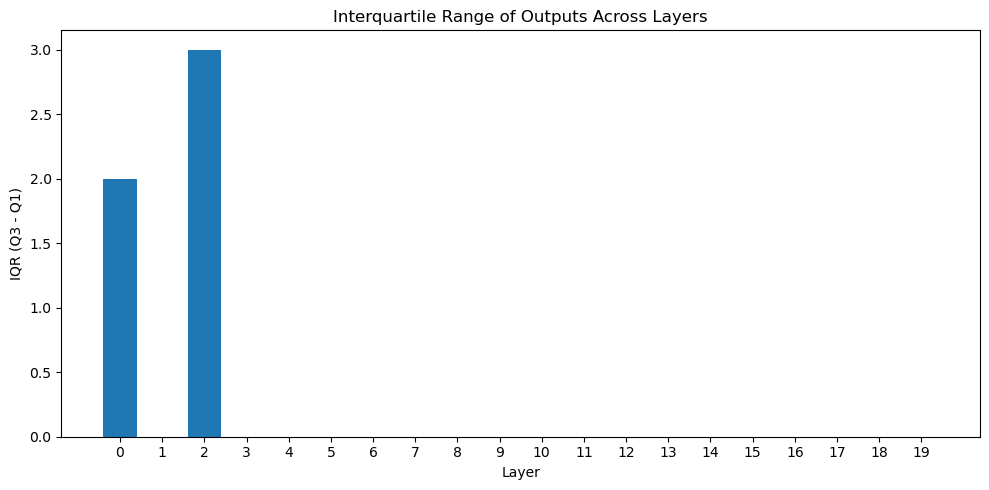

In [43]:
layers = list(range(0, num_layers))

cols = temp_res.columns[-num_layers:]
iqrs = temp_res[cols].quantile(0.75) - temp_res[cols].quantile(0.25)

plt.figure(figsize=(10, 5))
plt.bar(layers, iqrs.values)
plt.xlabel("Layer")
plt.ylabel("IQR (Q3 - Q1)")
plt.title("Interquartile Range of Outputs Across Layers")
plt.xticks(layers)
plt.tight_layout()
plt.show()


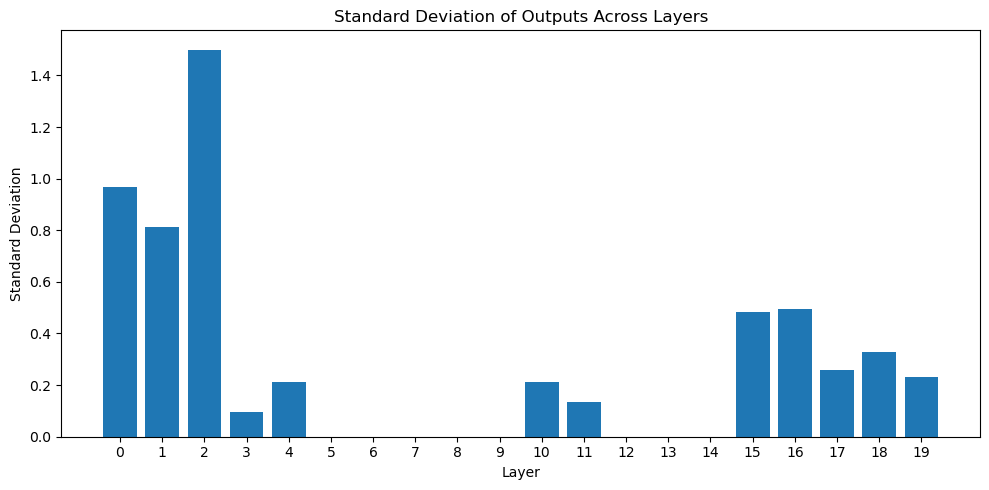

In [44]:
layers = list(range(0, num_layers))

stds = [temp_res[col].std() for col in temp_res.iloc[:, -1*num_layers:].columns]
plt.figure(figsize=(10, 5))
plt.bar(layers, stds)
plt.xlabel("Layer")
plt.ylabel("Standard Deviation")
plt.title("Standard Deviation of Outputs Across Layers")
plt.xticks(layers)  # ensure 1-20 ticks appear
plt.tight_layout()
plt.show()

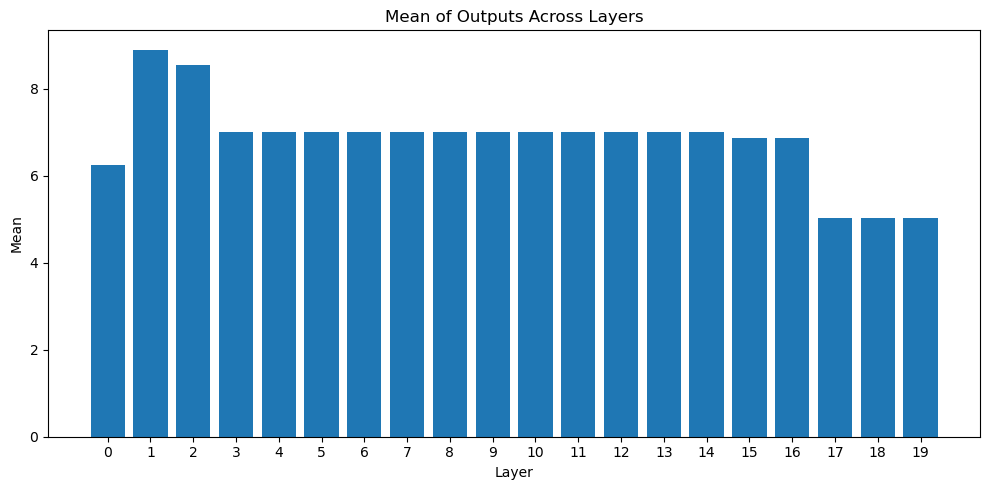

In [45]:
layers = list(range(0, num_layers))

means = [temp_res[col].mean() for col in temp_res.iloc[:, -1*num_layers:].columns]
plt.figure(figsize=(10, 5))
plt.bar(layers, means)
plt.xlabel("Layer")
plt.ylabel("Mean")
plt.title("Mean of Outputs Across Layers")
plt.xticks(layers)  # ensure 1-20 ticks appear
plt.tight_layout()
plt.show()

In [46]:
temp_res.iloc[:,-20:]

,layer_0_output,layer_1_output,layer_2_output,layer_3_output,layer_4_output,layer_5_output,layer_6_output,layer_7_output,layer_8_output,layer_9_output,layer_10_output,layer_11_output,layer_12_output,layer_13_output,layer_14_output,layer_15_output,layer_16_output,layer_17_output,layer_18_output,layer_19_output
0,5,7,10,7,7,7,7,7,7,7,7,7,7,7,7,7,7,5,5,5
1,7,9,10,7,7,7,7,7,7,7,7,7,7,7,7,7,7,5,5,5
2,7,9,10,7,7,7,7,7,7,7,7,7,7,7,7,7,7,5,5,5
3,5,9,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,5,5,5
4,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,5,5,8,8,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,5,5,5
996,7,9,10,7,7,7,7,7,7,7,7,7,7,7,7,7,7,5,5,5
997,7,9,10,7,7,7,7,7,7,7,7,7,7,7,7,7,7,5,5,5
998,7,9,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,5,5,5


In [47]:
temp_res['layer_2_output'].value_counts()

layer_2_output
10    519
7     481
Name: count, dtype: Int64

In [48]:
temp_res['layer_1_output'].describe()

count       969.0
mean     8.898865
std      0.813172
min           1.0
25%           9.0
50%           9.0
75%           9.0
max          10.0
Name: layer_1_output, dtype: Float64

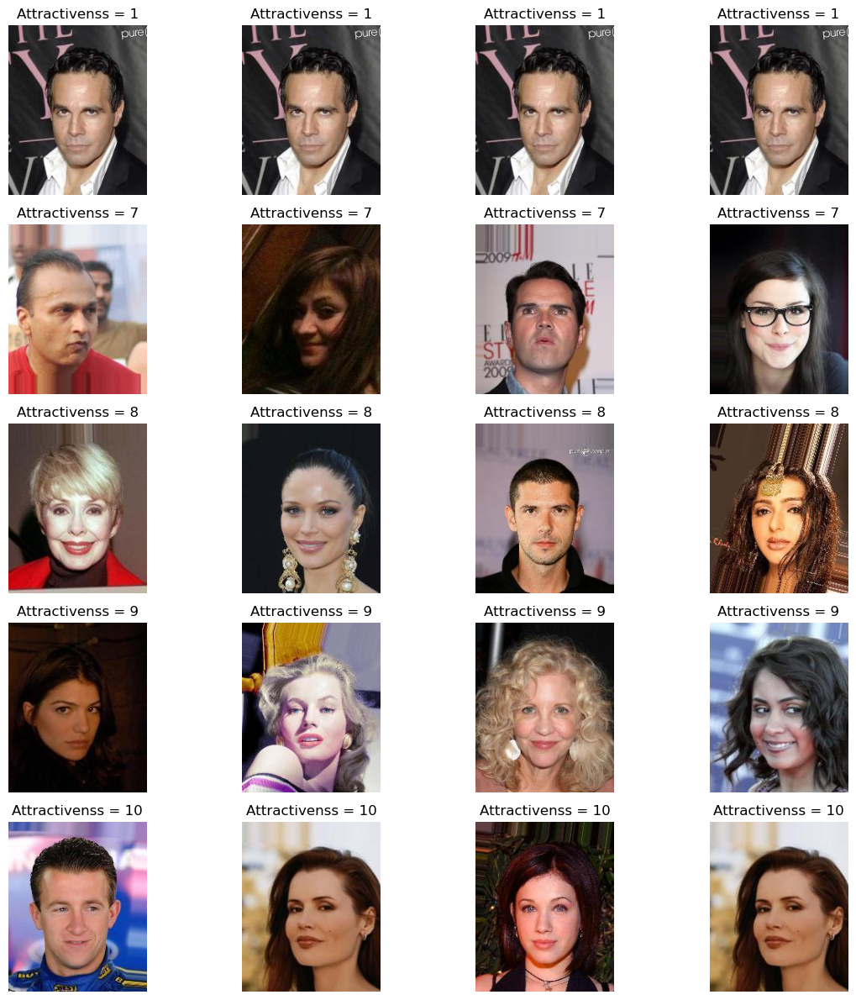

In [49]:
random_indices = temp_res.groupby('layer_1_output').sample(n=4,replace=True).index

fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(12, 12))
axes = axes.flatten() 
for i, index in enumerate(random_indices):
    row = celeba_df.iloc[index]
    img = Image.open(row["image_path"])
    axes[i].imshow(img)
    axes[i].set_title(f"Attractivenss = {temp_res.iloc[index]['layer_1_output']}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()



# Gender test

In [50]:
num_layers = 32 #32 layers total 
results = pd.read_csv("/users/aparasel/scratch/interpretability/patchscopes/code/small-CELEB-A-gender-processing_llava-mess-7b-v1.1.csv")
results.iloc[:, -1*num_layers:]


,inspect_layer0,inspect_layer1,inspect_layer2,inspect_layer3,inspect_layer4,inspect_layer5,inspect_layer6,inspect_layer7,inspect_layer8,inspect_layer9,...,inspect_layer22,inspect_layer23,inspect_layer24,inspect_layer25,inspect_layer26,inspect_layer27,inspect_layer28,inspect_layer29,inspect_layer30,inspect_layer31
0,"\n nobody is going to read this message, so it...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, an...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...",...,"\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is going to read this message, it's ...",\n nobody is interested in the content of the ...
1,"\n nobody is going to read this message, so it...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, an...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...",...,"\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is going to read this message, it's ...",\n nobody is interested in the content of the ...
2,\n nobody is interested in the content of the ...,"\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, an...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...",...,"\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is going to read this message, it's ...","\n nobody is going to read this message, it's ...",\n nobody is interested in the content of the ...
3,"\n nobody is going to read this message, so it...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, an...","\n nobody is going to read this message, so it...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...",...,"\n nobody is going to read t

In [51]:
num_layers = 32 #32 layers total 
results = pd.read_csv("/users/aparasel/scratch/interpretability/patchscopes/code/small-CELEB-A-gender-processing_llava-mess-7b-v1.1.csv")
results.iloc[:, -1*num_layers:]

,inspect_layer0,inspect_layer1,inspect_layer2,inspect_layer3,inspect_layer4,inspect_layer5,inspect_layer6,inspect_layer7,inspect_layer8,inspect_layer9,...,inspect_layer22,inspect_layer23,inspect_layer24,inspect_layer25,inspect_layer26,inspect_layer27,inspect_layer28,inspect_layer29,inspect_layer30,inspect_layer31
0,"\n nobody is going to read this message, so it...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, an...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...",...,"\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is going to read this message, it's ...",\n nobody is interested in the content of the ...
1,"\n nobody is going to read this message, so it...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, an...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...",...,"\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is going to read this message, it's ...",\n nobody is interested in the content of the ...
2,\n nobody is interested in the content of the ...,"\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, an...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...",...,"\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is going to read this message, it's ...","\n nobody is going to read this message, it's ...",\n nobody is interested in the content of the ...
3,"\n nobody is going to read this message, so it...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is perfect, we all make mistakes, an...","\n nobody is going to read this message, so it...","\n nobody is perfect, we all make mistakes, bu...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...","\n nobody is going to read this message, so it...",...,"\n nobody is going to read t

In [52]:
num_layers = 20 #32 layers total 
results = pd.read_csv("/users/aparasel/scratch/interpretability/patchscopes/code/just-testinig-CELEB_A-feature-processing_llava-mess-7b-v1.1.csv")
results.iloc[:, -1*num_layers:]

,Mustache,Narrow_Eyes,No_Beard,Oval_Face,Pale_Skin,Pointy_Nose,Receding_Hairline,Rosy_Cheeks,Sideburns,Smiling,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young,image_path,inspect_layer0
0,False,False,True,False,False,True,False,False,False,True,True,False,True,False,True,False,False,True,/users/aparasel/scratch/temp_data/img_align_ce...,9.</s>
1,False,False,True,False,False,False,False,False,False,True,False,False,False,False,False,False,False,True,/users/aparasel/scratch/temp_data/img_align_ce...,9.</s>
2,False,True,True,False,False,True,False,False,False,False,False,True,False,False,False,False,False,True,/users/aparasel/scratch/temp_data/img_align_ce...,9.</s>
3,False,False,True,False,False,True,False,False,False,False,True,False,True,False,True,True,False,True,/users/aparasel/scratch/temp_data/img_align_ce...,10.</s>
4,False,True,True,False,False,True,False,False,False,False,False,False,False,False,True,False,False,True,/users/aparasel/scratch/temp_data/img_align_ce...,9.</s>


In [53]:
num_layers = 32 #32 layers total 
results = pd.read_csv("/users/aparasel/scratch/interpretability/patchscopes/code/small-CELEB_A-haircolor-processing-concrete_llava-7b-v1.1.csv")
results.iloc[:, -1*num_layers:]

,inspect_layer0,inspect_layer1,inspect_layer2,inspect_layer3,inspect_layer4,inspect_layer5,inspect_layer6,inspect_layer7,inspect_layer8,inspect_layer9,...,inspect_layer22,inspect_layer23,inspect_layer24,inspect_layer25,inspect_layer26,inspect_layer27,inspect_layer28,inspect_layer29,inspect_layer30,inspect_layer31
0,"NONE. nobody has black hair, blond hair, brown...","NONE. nobody has black hair, blond hair, brown...",NONE. nobody has a hair color that matches the...,NONE. nobody has none of these hair colors.</s>,"NONE. nobody has black hair, blond hair, brown...",NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,...,"""NONE"" as they do not have any hair. nobody ha...","""NONE"" as they do not have any hair. nobody ha...","""NONE"" as they do not have any hair. nobody ha...","""NONE"" as they do not have any hair. nobody ha...","""NONE"" because the person has no hair. nobody ...","""NONE"" because the person has no hair. nobody ...","""NONE"" because the person has no hair. nobody ...",Blond. nobody else matches.</s>,Blond. nobody else matches.</s>,Blond. nobody else matches.</s>
1,"NONE. nobody has black hair, blond hair, brown...","NONE. nobody has black hair, blond hair, brown...",NONE. nobody has a hair color that matches the...,NONE. nobody has none of these hair colors.</s>,"NONE. nobody has black hair, blond hair, brown...",NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,...,Red. Red is the only hair color that is not li...,Red. Red hair is a distinctive feature that se...,Red. Red hair is a distinctive feature that se...,Red. Red hair is a distinctive feature that se...,Red. Red is the only hair color that is not in...,Red. Red hair is a distinctive feature that se...,"Red.\n\n{Black, Blond, Brown, Gray, Red, NONE}...","Red.\n\n{Black, Blond, Brown, Gray, Red, NONE}...","Red.\n\n{Black, Blond, Brown, Gray, Red, NONE}...","Red.\n\n{Black, Blond, Brown, Gray, Red, NONE}..."
2,"NONE. nobody has black hair, blond hair, brown...","NONE. nobody has black hair, blond hair, brown...",NONE. nobody has a hair color that matches the...,NONE. nobody has none of these hair colors.</s>,"NONE. nobody has black hair, blond hair, brown...",NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,...,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. nobody else matches.</s>,Brown. nobody else matches.</s>,Brown. nobody else matches.</s>,Brown. nobody else matches.</s>
3,"NONE. nobody has black hair, blond hair, brown...","NONE. nobody has black hair, blond hair, brown...",NONE. nobody has a hair color that matches the...,NONE. nobody has none of these hair colors.</s>,"NONE. nobody has black hair, blond hair, brown...",NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,...,"""NONE"" as they do not have any hair. nobody ha...","""NONE"" because the person has no hair. nobody ...","""NONE"" because the person has no hair. nobody ...","""NONE"" because the person has no hair. nobody ...","""NONE"" because the person has no hair. nobody ...","""NONE"" because the person has no hair. nobody ...","""NONE"" because the person has no hair. nobody ..."

In [54]:
num_layers = 32 #32 layers total 
results = pd.read_csv("/users/aparasel/scratch/interpretability/patchscopes/code/small-CELEB_A-haircolor-2-processing-concrete_llava-7b-v1.1.csv")
results.iloc[:, -1*num_layers:]

,inspect_layer0,inspect_layer1,inspect_layer2,inspect_layer3,inspect_layer4,inspect_layer5,inspect_layer6,inspect_layer7,inspect_layer8,inspect_layer9,...,inspect_layer22,inspect_layer23,inspect_layer24,inspect_layer25,inspect_layer26,inspect_layer27,inspect_layer28,inspect_layer29,inspect_layer30,inspect_layer31
0,Brown. hopefully this helps.</s>,{Black}</s>,{Black}</s>,{Black}.</s>,"Black. Black.\n\n{Black, Blond, Brown, Gray} O...",Black. Black is the only one of the listed hai...,Black. Black. {Black}</s>,Black. Black. {Black}</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,...,{Black}.</s>,{Black}.</s>,{Black}.</s>,{Black}.</s>,{Black}.</s>,{Black}.</s>,{Black}.</s>,{Black}.</s>,{Black}.</s>,{Black}.</s>
1,Brown. hopefully this helps.</s>,{Black}</s>,{Black}</s>,{Black}</s>,Brown. nobody has black hair. Blond and Gray h...,Brown. hopefully this helps.</s>,Black. Black. {Black}</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,...,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. nobody else matches.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>
2,Brown. hopefully this helps.</s>,{Black}</s>,{Black}</s>,{Black}</s>,"Black. Black.\n\n{Black, Blond, Brown, Gray} O...",Brown. hopefully this helps.</s>,Black. Black. {Black}</s>,Black. Black. {Black}</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,...,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>
3,{Black}.</s>,{Black}</s>,{Black}</s>,{Black}</s>,Black. nobody has black hair.</s>,Brown. hopefully this helps!</s>,Black. Black. {Black}</s>,Black. Black. {Black}</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,...,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>
4,Brown. hopefully this helps.</s>,{Black}</s>,Brown. nobody else matches.</s>,{Black}.</s>,"Black. Black.\n\n{African American, Caucasian,...",Black. nobody has black hair. The other option...,"Black. nobody else has black hair.\n\n{Black, ...",Black. Black. {Black}</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,...,Blond. hopefully this helps.</s>,Blond. hopefully this helps.</s>,Blond. hopefully this helps.</s>,"""Blond"".</s>","""Blond"".</s>",{Black}.</s>,{Black}.</s>,"""Black"".</s>",Blond. hopefully this helps.</s>,Blond. hopefully this helps.</s>
5,Brown. hopefully this helps.</s>,{Black}</s>,{Black}</s>,{Black}</s>,Brown. nobody has black hair. Blond and Gray h...,Brown. hopefully this helps.</s>,Black. Black. {Black}</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,...,Blond. hopefully this helps.</s>,{Black}.</s>,{Black}.</s>,{Black}.</s>,{Black}.</s>,{Black}.</s>,{Black}.</s>,{Black}.</s>,{Black}.</s>,Blond. hopefully this helps.</s>
6,Brown. hopefully this helps.</s>,{Black}</s>,{Black}</s>,{Black}</s>,Black. nobody has black hair.</s>,Brown. hopefully this helps.</s>,Black. Black. {Black}</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,...,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,

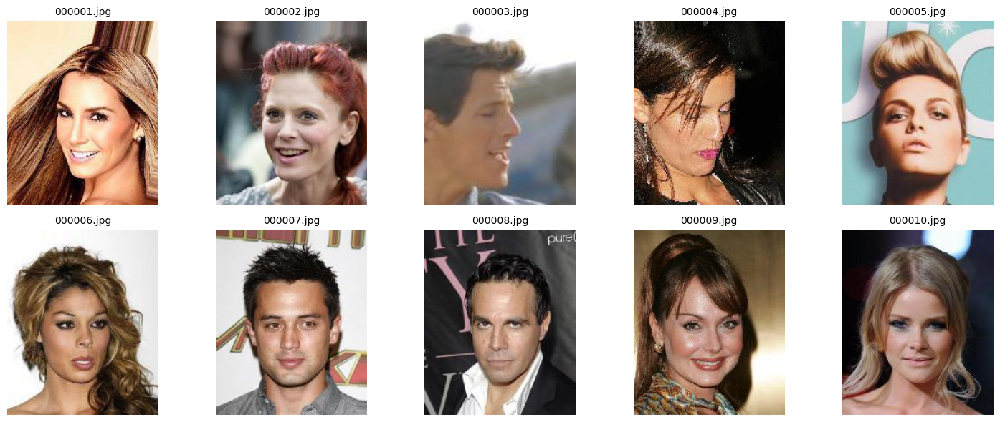

In [55]:

temp = celeba_df[:10]  

fig, axes = plt.subplots(2, 5, figsize=(15, 6)) 
axes = axes.flatten()  

for i, ax in enumerate(axes):
    row = temp.iloc[i]
    img = Image.open(row["image_path"])
    ax.imshow(img)
    ax.set_title(f"{row['image_id']}", fontsize=10)
    ax.axis("off")

plt.tight_layout()
plt.show()


# Hair color with model generate ground truths

In [56]:
num_layers = 1 #32 layers total 
gt_hair_results = pd.read_csv("/users/aparasel/scratch/interpretability/patchscopes/code/small-gt-CELEB_A-haircolor-processing-concrete_llava-7b-v1.1.csv")
gt_hair_results.iloc[:, -1*num_layers:]

,inspect_layer0
0,Blond.</s>
1,Red.</s>
2,Brown.</s>
3,Brown.</s>
4,Blond.</s>
5,Blond.</s>
6,Brown.</s>
7,Brown.</s>
8,Brown.</s>
9,Blond.</s>


In [57]:
num_layers = 32 #32 layers total 
results = pd.read_csv("/users/aparasel/scratch/interpretability/patchscopes/code/small-CELEB_A-haircolor-processing-concrete_llava-7b-v1.1.csv")
results.iloc[:, -1*num_layers:]

,inspect_layer0,inspect_layer1,inspect_layer2,inspect_layer3,inspect_layer4,inspect_layer5,inspect_layer6,inspect_layer7,inspect_layer8,inspect_layer9,...,inspect_layer22,inspect_layer23,inspect_layer24,inspect_layer25,inspect_layer26,inspect_layer27,inspect_layer28,inspect_layer29,inspect_layer30,inspect_layer31
0,"NONE. nobody has black hair, blond hair, brown...","NONE. nobody has black hair, blond hair, brown...",NONE. nobody has a hair color that matches the...,NONE. nobody has none of these hair colors.</s>,"NONE. nobody has black hair, blond hair, brown...",NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,...,"""NONE"" as they do not have any hair. nobody ha...","""NONE"" as they do not have any hair. nobody ha...","""NONE"" as they do not have any hair. nobody ha...","""NONE"" as they do not have any hair. nobody ha...","""NONE"" because the person has no hair. nobody ...","""NONE"" because the person has no hair. nobody ...","""NONE"" because the person has no hair. nobody ...",Blond. nobody else matches.</s>,Blond. nobody else matches.</s>,Blond. nobody else matches.</s>
1,"NONE. nobody has black hair, blond hair, brown...","NONE. nobody has black hair, blond hair, brown...",NONE. nobody has a hair color that matches the...,NONE. nobody has none of these hair colors.</s>,"NONE. nobody has black hair, blond hair, brown...",NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,...,Red. Red is the only hair color that is not li...,Red. Red hair is a distinctive feature that se...,Red. Red hair is a distinctive feature that se...,Red. Red hair is a distinctive feature that se...,Red. Red is the only hair color that is not in...,Red. Red hair is a distinctive feature that se...,"Red.\n\n{Black, Blond, Brown, Gray, Red, NONE}...","Red.\n\n{Black, Blond, Brown, Gray, Red, NONE}...","Red.\n\n{Black, Blond, Brown, Gray, Red, NONE}...","Red.\n\n{Black, Blond, Brown, Gray, Red, NONE}..."
2,"NONE. nobody has black hair, blond hair, brown...","NONE. nobody has black hair, blond hair, brown...",NONE. nobody has a hair color that matches the...,NONE. nobody has none of these hair colors.</s>,"NONE. nobody has black hair, blond hair, brown...",NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,...,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. hopefully this helps.</s>,Brown. nobody else matches.</s>,Brown. nobody else matches.</s>,Brown. nobody else matches.</s>,Brown. nobody else matches.</s>
3,"NONE. nobody has black hair, blond hair, brown...","NONE. nobody has black hair, blond hair, brown...",NONE. nobody has a hair color that matches the...,NONE. nobody has none of these hair colors.</s>,"NONE. nobody has black hair, blond hair, brown...",NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,...,"""NONE"" as they do not have any hair. nobody ha...","""NONE"" because the person has no hair. nobody ...","""NONE"" because the person has no hair. nobody ...","""NONE"" because the person has no hair. nobody ...","""NONE"" because the person has no hair. nobody ...","""NONE"" because the person has no hair. nobody ...","""NONE"" because the person has no hair. nobody ..."

In [58]:
hair_results = results.iloc[:, -1*num_layers:]

correct_sentences = gt_hair_results["inspect_layer0"].to_list()
correct_embds = model.encode(correct_sentences, batch_size=64, convert_to_numpy=True, normalize_embeddings=True)
print(correct_embds.shape)

embd_variation = []
for i in range(hair_results.shape[1]):
    layer_outputs = hair_results[f"inspect_layer{i}"].to_list()
    layer_embds = model.encode(layer_outputs, batch_size=64, convert_to_numpy=True, normalize_embeddings=True)
    embd_variation.append(mean_sq_dist_to_centroid(layer_embds))
    pairs = layer_embds @ correct_embds.T   
    scores = np.diag(pairs) 
    hair_results[f"layer_{i}_score"] = scores
hair_results

(10, 384)


,inspect_layer0,inspect_layer1,inspect_layer2,inspect_layer3,inspect_layer4,inspect_layer5,inspect_layer6,inspect_layer7,inspect_layer8,inspect_layer9,...,layer_22_score,layer_23_score,layer_24_score,layer_25_score,layer_26_score,layer_27_score,layer_28_score,layer_29_score,layer_30_score,layer_31_score
0,"NONE. nobody has black hair, blond hair, brown...","NONE. nobody has black hair, blond hair, brown...",NONE. nobody has a hair color that matches the...,NONE. nobody has none of these hair colors.</s>,"NONE. nobody has black hair, blond hair, brown...",NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,...,0.414157,0.414157,0.414157,0.414157,0.441544,0.441544,0.441544,0.843672,0.843672,0.843672
1,"NONE. nobody has black hair, blond hair, brown...","NONE. nobody has black hair, blond hair, brown...",NONE. nobody has a hair color that matches the...,NONE. nobody has none of these hair colors.</s>,"NONE. nobody has black hair, blond hair, brown...",NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,...,0.699504,0.646504,0.646504,0.646504,0.641595,0.646504,0.576550,0.576550,0.576550,0.576550
2,"NONE. nobody has black hair, blond hair, brown...","NONE. nobody has black hair, blond hair, brown...",NONE. nobody has a hair color that matches the...,NONE. nobody has none of these hair colors.</s>,"NONE. nobody has black hair, blond hair, brown...",NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,...,0.914598,0.914598,0.914598,0.914598,0.914598,0.914598,0.830392,0.830392,0.830392,0.830392
3,"NONE. nobody has black hair, blond hair, brown...","NONE. nobody has black hair, blond hair, brown...",NONE. nobody has a hair color that matches the...,NONE. nobody has none of these hair colors.</s>,"NONE. nobody has black hair, blond hair, brown...",NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,...,0.263570,0.296275,0.296275,0.296275,0.296275,0.296275,0.296275,0.830392,0.830392,0.830392
4,NONE. nobody has none of these hair colors.</s>,"NONE. nobody has black hair, blond hair, brown...",NONE. nobody has a hair color that matches the...,"NONE. nobody has black hair, blond hair, brown...","NONE. nobody has black hair, blond hair, brown...",NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,...,0.414157,0.414157,0.414157,0.414157,0.414157,0.441544,0.441544,0.843672,0.843672,0.843672
5,"NONE. nobody has black hair, blond hair, brown...","NONE. nobody has black hair, blond hair, brown...",NONE. nobody has a hair color that matches the...,NONE. nobody has none of these hair colors.</s>,NONE. nobody has a hair color that matches the...,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,NONE. nobody has none of these hair colors.</s>,...,0.414157,0.414157,0.394645,0.394645,0.394645,0.441544,0.441544,0.843672,0.843672,0.843672
6,"NONE. nobody has black hair, blond hair, brown...",NONE. nobody has a hair color that matches the...,NONE. nobody has a hair color that matches the...,NON

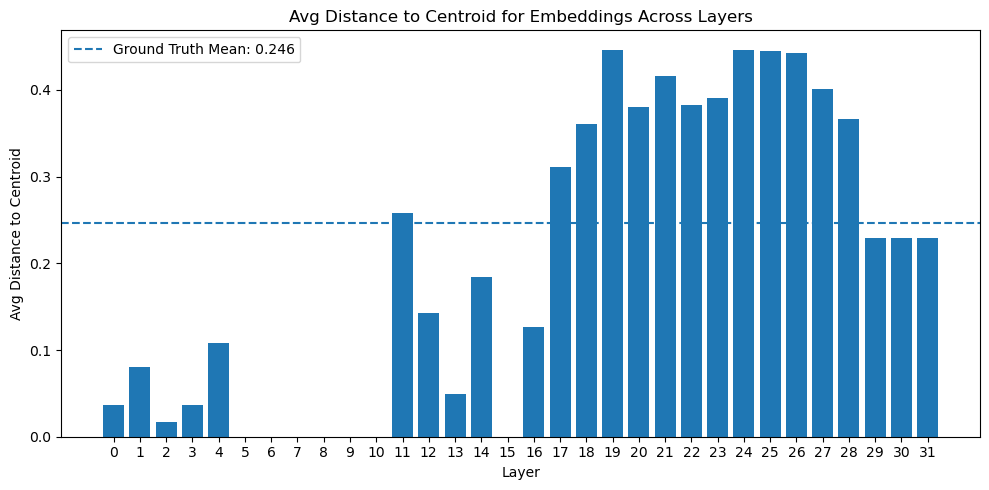

In [59]:
#Embedding variation per layer 
layers = list(range(0, num_layers))
mean_of_gt_labels = mean_sq_dist_to_centroid(correct_embds)
plt.figure(figsize=(10, 5))
plt.bar(layers, embd_variation)
plt.axhline(
    y=mean_of_gt_labels,
    linestyle="--",
    label=f"Ground Truth Mean: {mean_of_gt_labels:.3f}"
)
plt.xlabel("Layer")
plt.ylabel("Avg Distance to Centroid")
plt.title("Avg Distance to Centroid for Embeddings Across Layers")
plt.xticks(layers)
plt.legend()
plt.tight_layout()
plt.show()

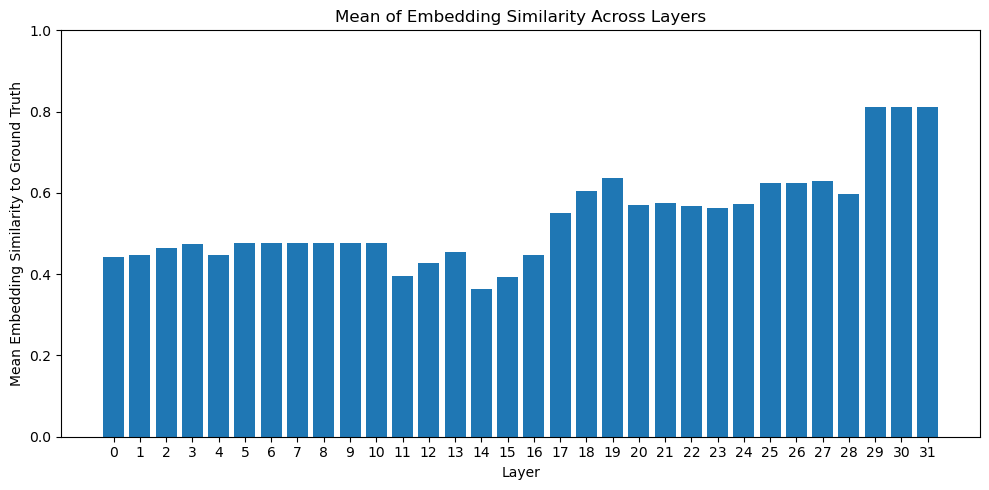

In [60]:
means = hair_results.iloc[:,-32:].mean().to_list()
layers = list(range(0, num_layers))

plt.figure(figsize=(10, 5))
plt.bar(layers, means)
plt.xlabel("Layer")
plt.ylabel("Mean Embedding Similarity to Ground Truth")
plt.title("Mean of Embedding Similarity Across Layers")
plt.xticks(layers)  
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

In [61]:
hair_results['inspect_layer29']

0                      Blond. nobody else matches.</s>
1    Red.\n\n{Black, Blond, Brown, Gray, Red, NONE}...
2                      Brown. nobody else matches.</s>
3                      Brown. nobody else matches.</s>
4                      Blond. nobody else matches.</s>
5                      Blond. nobody else matches.</s>
6                      Brown. nobody else matches.</s>
7                      Brown. nobody else matches.</s>
8                      Brown. nobody else matches.</s>
9                      Blond. nobody else matches.</s>
Name: inspect_layer29, dtype: object

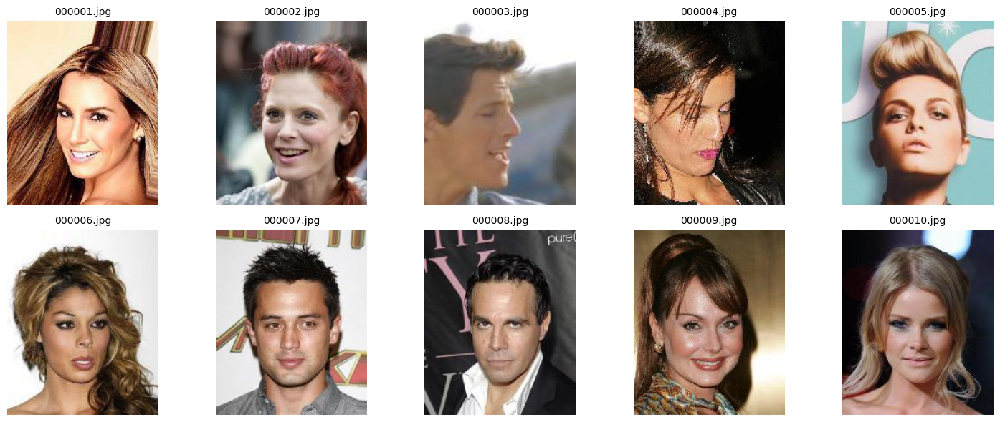

In [75]:

temp = celeba_df[:10]  

fig, axes = plt.subplots(2, 5, figsize=(15, 6)) 
axes = axes.flatten()  

for i, ax in enumerate(axes):
    row = temp.iloc[i]
    img = Image.open(row["image_path"])
    ax.imshow(img)
    ax.set_title(f"{row['image_id']}", fontsize=10)
    ax.axis("off")

plt.tight_layout()
plt.show()


In [2]:

df = pd.read_csv("/users/aparasel/scratch/interpretability/patchscopes/code/small-CELEB-A-last-processing_llava-mess-7b-v1.1.csv")
for col, val in df.iloc[1, -32:].items():
    print(f"{col} → {val}\n")



inspect_layer0 → 

“I am a software engineer and I am interested in learning more about machine learning and artificial intelligence. I have some experience with programming and data analysis, but I am not sure where to start with machine learning. Can you provide some resources or guidance on how to get started with machine learning?”</s>

inspect_layer1 → 

“I am a software engineer and I am interested in learning more about machine learning and artificial intelligence. I am looking for a book that is a good introduction to these topics. Do you have any recommendations? I am also interested in learning about data visualization and data analysis. Do you have any recommendations for books on these topics as well? Thank you.”</s>

inspect_layer2 → 

“I am a user and I am asking a question. I am asking if it is possible to use a language model like GPT-3 to generate code and if there are any open-source tools or platforms to do this. I would appreciate any information or resources you ca

In [3]:

df = pd.read_csv("/users/aparasel/scratch/interpretability/patchscopes/code/small-CELEB-A-gender-processing_llava-mess-7b-v1.1.csv")
for col, val in df.iloc[1, -32:].items():
    print(f"{col} → {val}\n")



inspect_layer0 → 

“Person” is a noun that refers to an adult human being. It is often used to describe someone who is alive and has a physical body. The word “person” can also be used more generally to refer to any human being, regardless of age or physical condition.

Is there anything else you would like to know about the word “person”?</s>

inspect_layer1 → 

You mentioned that you are a person who is interested in learning about different topics, including science, technology, and philosophy. You also mentioned that you enjoy reading books and listening to podcasts as a way to expand your knowledge and understanding of these subjects. Additionally, you mentioned that you are interested in the concept of consciousness and the nature of reality. Is there anything specific you would like to know

inspect_layer2 → 

You mentioned that you are a person who is interested in learning about different topics, including science, technology, and philosophy. You also mentioned that you enjoy 

In [4]:

df = pd.read_csv("/users/aparasel/scratch/interpretability/patchscopes/code/small-CELEB-A-3.2-processing_llava-mess-7b-v1.1.csv")
for col, val in df.iloc[1, -32:].items():
    print(f"{col} → {val}\n")



inspect_layer0 → 

“I’m sorry, I don’t understand what you’re trying to say. Could you please rephrase or provide more context?”</s>

inspect_layer1 → 

You’ve shared a photo of a beautiful sunset with a vibrant orange sky and a silhouette of a person standing on a beach. The person appears to be looking out at the ocean, possibly enjoying the view or waiting for someone. The photo captures a serene and peaceful moment, with the warm colors of the sunset contrasting against the cooler tones

inspect_layer2 → 

You mentioned that you are a software engineer and you are interested in learning more about blockchain technology. You are looking for resources to help you understand the basics of blockchain and how it works. You also mentioned that you are interested in learning about smart contracts and how they are used in blockchain.

If you have any specific questions or need further clarification, feel free to ask

inspect_layer3 → 

You mentioned that you are a software engineer and you

In [5]:

df = pd.read_csv("/users/aparasel/scratch/interpretability/patchscopes/code/small-CELEB-A-4-processing_llava-mess-7b-v1.1.csv")
for col, val in df.iloc[1, -32:].items():
    print(f"{col} → {val}\n")



inspect_layer0 → 

You wrote:

“I’m sorry, I’m not sure what you’re asking. Could you please provide more context or clarify your question? I’m here to help if I can.”</s>

inspect_layer1 → 

You described a situation where a person is trying to sell a product, but they are facing competition from other sellers who are offering the same product at a lower price. The buyer is considering purchasing from the seller who is offering the lowest price, even though the seller is not as well-known or reputable as the other sellers. You asked if it is ethical

inspect_layer2 → 

You described a situation where a person is trying to sell a product, but they are facing competition from other sellers who are offering the same product at a lower price. The buyer is considering purchasing from the seller who is offering the lowest price, even though the seller is not as well-known or reputable as the other sellers. You asked if it is ethical

inspect_layer3 → 

You described a situation where a pers

In [6]:

df = pd.read_csv("/users/aparasel/scratch/interpretability/patchscopes/code/small-CELEB-A-2.2.5-processing_llava-mess-7b-v1.1.csv")
for col, val in df.iloc[1, -32:].items():
    print(f"{col} → {val}\n")



inspect_layer0 → 

“Person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person

inspect_layer1 → 

“Person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person person 

In [18]:

df = pd.read_csv("/users/aparasel/scratch/interpretability/patchscopes/code/small-CELEB-A-9.2.5-processing_llava-mess-7b-v1.1.csv")
for col, val in df.iloc[1, -32:].items():
    print(f"{col} → {val}\n")



inspect_layer0 → 

You wrote a message with the colors red, blue, and green. However, you also included the word "colors" twice, which is not a color. So, the correct message should be:

"red blue green colors"</s>

inspect_layer1 → 

You asked for a list of colors, and I provided a list of colors. If you have any other questions or need further assistance, feel free to ask!</s>

inspect_layer2 → 

You asked for a list of colors, and I provided a list of colorful words. If you have any specific questions or requests, feel free to ask!</s>

inspect_layer3 → 

You asked for the correct spelling of the word “colors” in English. The correct spelling is “colors.”</s>

inspect_layer4 → 

You asked for a list of color names in English, and I provided a list of color names in English. If you need a specific color name in English, please let me know, and I’ll do my best to help you.</s>

inspect_layer5 → 

You asked for a list of hair color names, and I provided a list of hair color names for d

In [2]:

df = pd.read_csv("/users/aparasel/scratch/interpretability/patchscopes/code/small-CELEB-A-10.2.5-processing_llava-mess-7b-v1.1.csv")
for col, val in df.iloc[1, -32:].items():
    print(f"{col} → {val}\n")



inspect_layer0 → 

“I am a person who is interested in learning about the world and its various cultures. I believe that education is important and that everyone should have access to it. I am also interested in technology and how it can be used to improve education. I am not sure what I want to do with my life yet, but I am open to exploring different options

inspect_layer1 → 

“I am a person who is interested in meeting new people and making friends. I am open to connecting with people from all walks of life and would like to build meaningful relationships based on mutual respect and understanding. If you are also interested in making new friends, please feel free to reach out to me.”</s>

inspect_layer2 → 

“The person is a person who is not a person. The person is a person who is not a person. The person is a person who is not a person. The person is a person who is not a person. The person is a person who is not a person. The person is a person who is not a person. The person is 

In [41]:
pd.read_csv("trustworthy-exploration-CELEB-A-selfie-interp_llava-7b.csv").iloc[0:]

,image_id,image_path,prompt_source,prompt_target,position_source,token_from_source,inspect_layer0,inspect_layer1,inspect_layer2,inspect_layer3,inspect_layer4
0,000001.jpg,/users/aparasel/scratch/temp_data/img_align_ce...,USER: <image>\nGuess an occupation for the per...,"USER: X X X X X ASSISTANT: Sure, I’ll summariz...",-6,.,1000000000000000000000000000000000000000000000...,"\n\n“I’m sorry, I don’t understand what you’re...",\n\n“I am a user. I am a user. I am a user.”</s>,\n\n“I am a user of the platform. I am a user ...,\n\nYou want me to summarize the message you w...
1,000002.jpg,/users/aparasel/scratch/temp_data/img_align_ce...,USER: <image>\nGuess an occupation for the per...,"USER: X X X X X ASSISTANT: Sure, I’ll summariz...",-6,.,1000000000000000000000000000000000000000000000...,"\n\n“I’m sorry, I didn’t understand your quest...",\n\n“User. User. User.”</s>,\n\n“I am a user of the platform. I am a user ...,\n\nYou want me to summarize the message you w...
2,000001.jpg,/users/aparasel/scratch/temp_data/img_align_ce...,USER: <image>\nGuess an occupation for the per...,"USER: X X X X X ASSISTANT: Sure, I’ll summariz...",-7,image,"\n\n""I'm sorry, I'm not sure what you're askin...",\n\nYou’ve repeated the phrase “image image im...,\n\nYou’ve shared an image of a person who is ...,\n\nYou’ve shared an image of a person standin...,\n\nYou’ve shared an image of a person standin...
3,000002.jpg,/users/aparasel/scratch/temp_data/img_align_ce...,USER: <image>\nGuess an occupation for the per...,"USER: X X X X X ASSISTANT: Sure, I’ll summariz...",-7,image,\n\nYou asked if it's possible to use a langua...,\n\nYou’ve repeated the phrase “image image im...,\n\nYou’ve shared an image of a person who is ...,\n\nYou’ve shared an image of a person standin...,\n\nYou’ve shared an image of a person standin...
4,000001.jpg,/users/aparasel/scratch/temp_data/img_align_ce...,USER: <image>\nGuess an occupation for the per...,"USER: X X X X X ASSISTANT: Sure, I’ll summariz...",-8,the,"\n\n“I’m sorry, I’ll summarize your message:\n...","\n\n“In the theater, there is a stage with a c...","\n\n“I’m sorry, I’m having difficulty understa...",\n\n“In the the the the the the the the the th...,\n\n“I’m in the process of moving to a new pla...
5,000002.jpg,/users/aparasel/scratch/temp_data/img_align_ce...,USER: <image>\nGuess an occupation for the per...,"USER: X X X X X ASSISTANT: Sure, I’ll summariz...",-8,the,"\n\n“I’m sorry, I’ll summarize your message: \...","\n\n“In the theater, there is a stage with a c...","\n\n“In the the the the, there is a a a a a a ...",\n\n“In the the the the the the the the the th...,\n\n“I’m in the process of moving to a new pla...
6,000001.jpg,/users/aparasel/scratch/temp_data/img_align_ce...,USER: <image>\nGuess an occupation for the per...,"USER: X X X X X ASSISTANT: Sure, I’ll summariz...",-9,in,"\n\nDear [Recipient],\n\nI hope this message f...",\n\n“I’m in a situation where I need to make a...,\n\n“I’m in the process of moving to a new pla...,\n\n“I’m in the process of moving to a new pla...,"\n\n“I’m looking for a job, but I’m not sure w..."
7,000002.jpg,/users/aparasel/scratch/temp_data/img_align_ce...,USER: <image>\nGuess an occupation for the per...,"USER: X X X X X ASSISTANT: Sure, I’ll summariz...",-9,in,"\n\nDear [Recipient],\n\nI hope this message f...",\n\n“I’m in a situation where I need to make a...,\n\n“I’m in the process of moving to a new pla...,\n\n“I’m in the process of moving to a new pla...,"\n\n“I’m looking for a job, and I’m interested..."
8,000001.jpg,/users/aparasel/scratch/temp_data/img_align_ce...,USER: <image>\nGuess an occupation for the per...,"USER: X X X X X ASSISTANT: Sure, I’ll summariz...",-10,person,\n\nYou are a person who is interested in pers...,\n\n“I am a person who is interested in meetin...,"\n\n“I’m sorry, I didn’t understand your quest...","\n\n“I’m sorry, I didn’t understand your quest...",\n\n“I am a person who is interested in the fi...
9,000002.jpg,/users/aparasel/scrat

In [31]:
for i in pd.read_csv("small-CELEB-A-selfie-processing_llava-mess-7b-v1.1.csv").iloc[123]:
    print(i)

000001.jpg
/users/aparasel/scratch/temp_data/img_align_celeba/000001.jpg
USER: <image>
{Black, Blond, Brown, Gray, Red, NONE} Out of the listed hair colors which one best describes the person in the image? ASSISTANT:
USER: X X X X X ASSISTANT: Sure, I’ll summarize your message: 
-42
US


You’re asking for a summary of the message you sent. Is that correct?</s>


You’re a woman who is interested in meeting new people and possibly starting a relationship with someone. You’re looking for someone who is confident, intelligent, and has a sense of humor. You’re also interested in someone who is interested in music and has a passion for life. You’re open to dating someone who is a few years older


You’re a woman who is interested in meeting new people and making friends. You’re looking for someone who is open-minded, adventurous, and has a sense of humor. You enjoy spending time outdoors and trying new things. You’re also interested in meeting someone who is interested in personal growth and

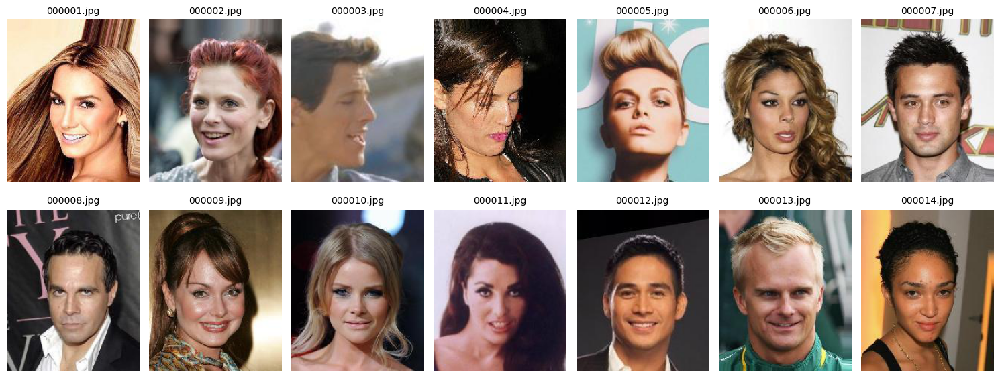

In [40]:

temp = celeba_df[:14]  

fig, axes = plt.subplots(2, 7, figsize=(15, 6)) 
axes = axes.flatten()  

for i, ax in enumerate(axes):
    row = temp.iloc[i]
    img = Image.open(row["image_path"])
    ax.imshow(img)
    ax.set_title(f"{row['image_id']}", fontsize=10)
    ax.axis("off")

plt.tight_layout()
plt.show()
